In [1]:
# Imports.
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

tfd = tf.contrib.distributions

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [2]:
# Model & Plotting.

neurons = 256

# Encoder.
def make_encoder(data, code_size):
    x = tf.layers.flatten(data)
    h1 = tf.layers.dense(x, neurons, tf.nn.relu)
    h2 = tf.layers.dense(h1, neurons, tf.nn.relu)
    loc = tf.layers.dense(h2, code_size, tf.nn.tanh)
    scl = tf.layers.dense(h2, code_size, tf.nn.softplus)
    return tfd.MultivariateNormalDiag(loc, scl)

# Prior.
def make_prior(code_size):
    loc = tf.zeros(code_size)
    scl = tf.ones(code_size)
    return tfd.MultivariateNormalDiag(loc, scl)

# Decoder
def make_decoder(code, data_shape):
    x = code
    h1 = tf.layers.dense(x, neurons, tf.nn.relu)
    h2 = tf.layers.dense(h1, neurons, tf.nn.relu)
    loc = tf.layers.dense(h2, np.prod(data_shape), tf.nn.softplus)
    scl = tf.layers.dense(h2, np.prod(data_shape), tf.nn.softplus)
    
    return loc, scl

# Optimisation
make_encoder = tf.make_template('encoder', make_encoder)
make_decoder = tf.make_template('decoder', make_decoder)

In [3]:
# Dataset retrieval.
X_train = np.load('FireEvac_train_set.npy')
X_test = np.load('FireEvac_test_set.npy')


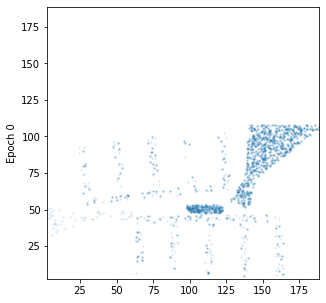

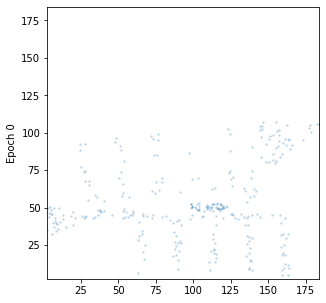

In [4]:
# Plotting.
def plot(epoch, codes, size=2):
    ig, ax = plt.subplots(ncols=1, figsize=(size, size))
    no_ticks = dict(left='off', bottom='off', labelleft='off', labelbottom='off')
    ax.set_ylabel('Epoch {}'.format(epoch))
    ax.scatter(codes[:, 0], codes[:, 1], s=2, alpha=0.1)
    ax.set_aspect('equal')
    ax.set_xlim(codes.min() - .1, codes.max() + .1)
    ax.set_ylim(codes.min() - .1, codes.max() + .1)
    ax.tick_params(axis='both', which='both', **no_ticks)
    plt.show()
    
plot(0, X_train, size=5)
plot(0, X_test, size=5)

In [5]:
data = tf.placeholder(tf.float32, [None, 2])

cs = 1000

# Define the model.
prior = make_prior(code_size=cs)
posterior = make_encoder(data, code_size=cs)
code = posterior.sample()

# Define the loss.
loc, scl = make_decoder(code, [2])

mvn = tfd.Independent(tfd.MultivariateNormalDiag(loc, scl))
likelihood = mvn.log_prob(data)

divergence = tfd.kl_divergence(posterior, prior)
elbo = tf.reduce_mean(likelihood - .5*divergence)
optimize = tf.train.AdamOptimizer(0.001).minimize(-elbo)

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlo

Epoch 0 elbo -1037435100.0


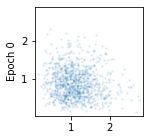

Reconstruction:


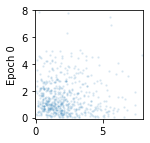

Epoch 1 elbo -52.52089


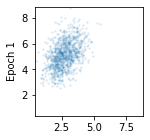

Reconstruction:


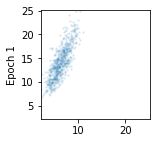

Epoch 2 elbo -24.226276


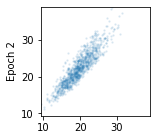

Reconstruction:


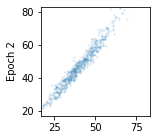

Epoch 3 elbo -12.078522


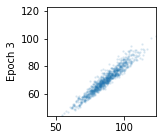

Reconstruction:


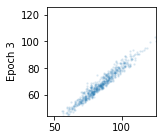

Epoch 4 elbo -11.602661


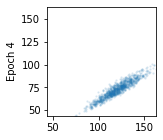

Reconstruction:


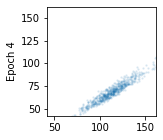

Epoch 5 elbo -11.709138


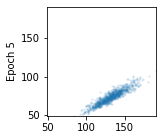

Reconstruction:


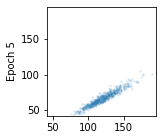

Epoch 6 elbo -11.397555


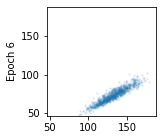

Reconstruction:


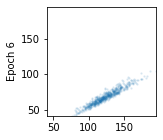

Epoch 7 elbo -11.513492


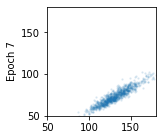

Reconstruction:


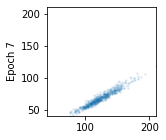

Epoch 8 elbo -11.468407


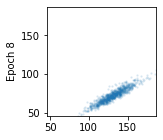

Reconstruction:


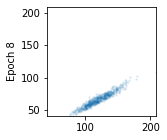

Epoch 9 elbo -11.402606


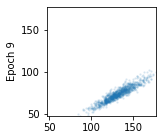

Reconstruction:


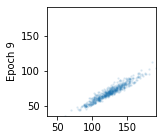

Epoch 10 elbo -11.458466


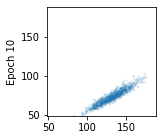

Reconstruction:


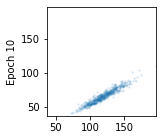

Epoch 11 elbo -11.489013


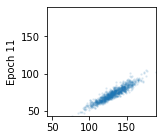

Reconstruction:


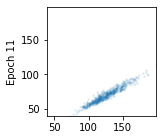

Epoch 12 elbo -11.4580765


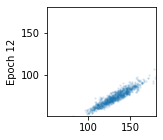

Reconstruction:


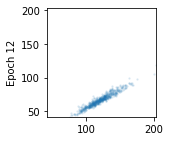

Epoch 13 elbo -11.318002


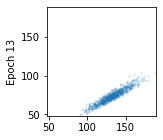

Reconstruction:


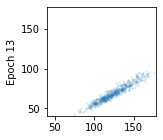

Epoch 14 elbo -11.304687


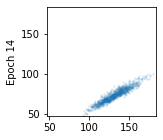

Reconstruction:


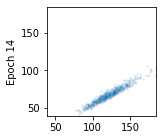

Epoch 15 elbo -11.354094


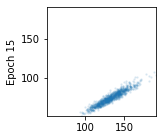

Reconstruction:


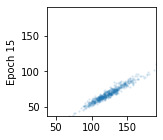

Epoch 16 elbo -11.381143


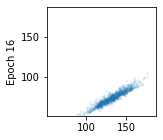

Reconstruction:


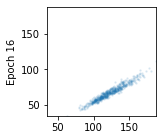

Epoch 17 elbo -11.582298


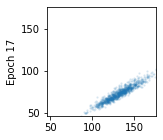

Reconstruction:


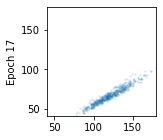

Epoch 18 elbo -11.369533


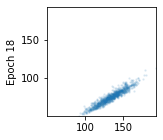

Reconstruction:


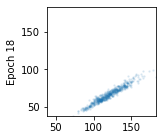

Epoch 19 elbo -11.276484


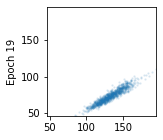

Reconstruction:


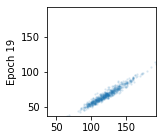

Epoch 20 elbo -11.267558


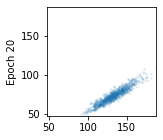

Reconstruction:


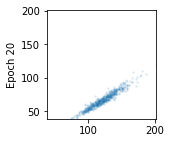

Epoch 21 elbo -11.394352


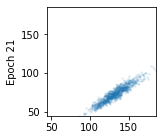

Reconstruction:


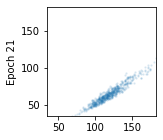

Epoch 22 elbo -11.483272


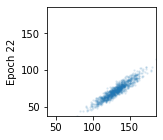

Reconstruction:


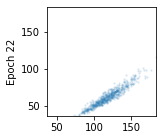

Epoch 23 elbo -11.393582


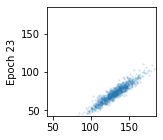

Reconstruction:


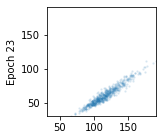

Epoch 24 elbo -10.98138


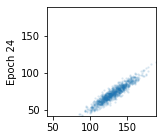

Reconstruction:


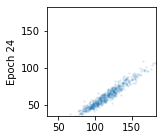

Epoch 25 elbo -11.041696


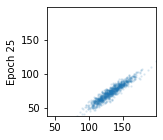

Reconstruction:


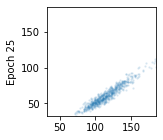

Epoch 26 elbo -11.055687


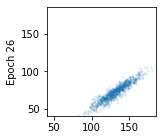

Reconstruction:


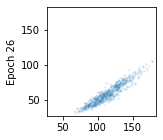

Epoch 27 elbo -10.991487


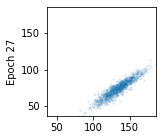

Reconstruction:


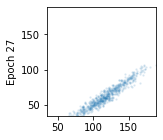

Epoch 28 elbo -10.908335


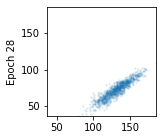

Reconstruction:


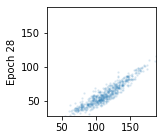

Epoch 29 elbo -10.897078


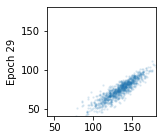

Reconstruction:


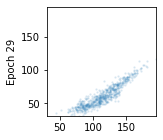

Epoch 30 elbo -10.708241


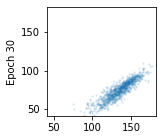

Reconstruction:


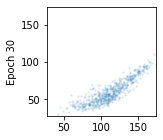

Epoch 31 elbo -10.832868


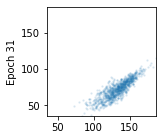

Reconstruction:


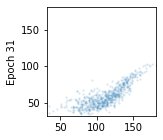

Epoch 32 elbo -10.631243


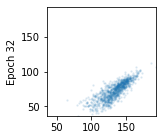

Reconstruction:


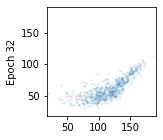

Epoch 33 elbo -10.699894


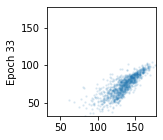

Reconstruction:


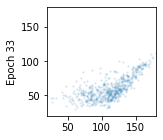

Epoch 34 elbo -10.621623


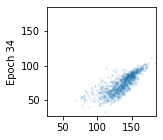

Reconstruction:


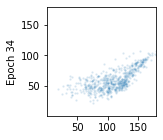

Epoch 35 elbo -10.680128


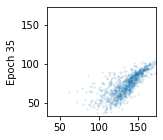

Reconstruction:


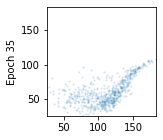

Epoch 36 elbo -10.7296295


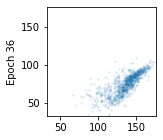

Reconstruction:


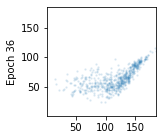

Epoch 37 elbo -10.446255


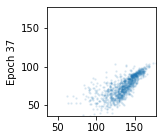

Reconstruction:


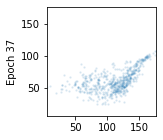

Epoch 38 elbo -10.694995


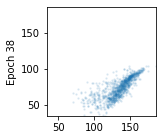

Reconstruction:


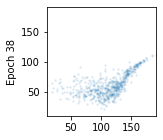

Epoch 39 elbo -10.556727


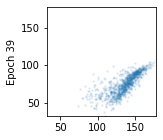

Reconstruction:


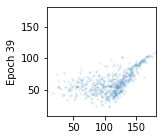

Epoch 40 elbo -10.561909


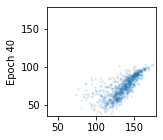

Reconstruction:


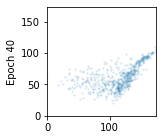

Epoch 41 elbo -10.577821


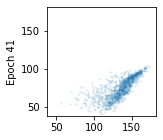

Reconstruction:


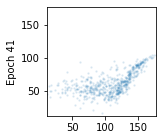

Epoch 42 elbo -10.421267


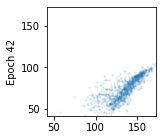

Reconstruction:


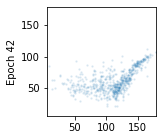

Epoch 43 elbo -10.388881


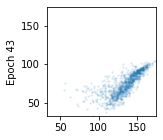

Reconstruction:


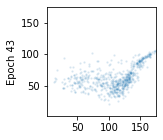

Epoch 44 elbo -10.493033


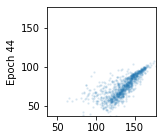

Reconstruction:


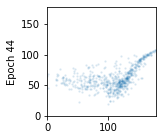

Epoch 45 elbo -10.645819


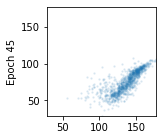

Reconstruction:


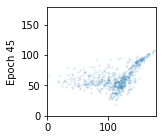

Epoch 46 elbo -10.48926


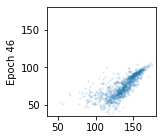

Reconstruction:


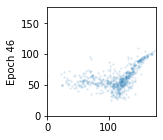

Epoch 47 elbo -10.360008


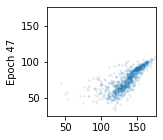

Reconstruction:


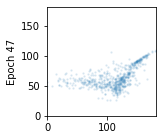

Epoch 48 elbo -10.326715


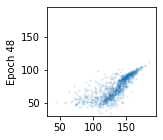

Reconstruction:


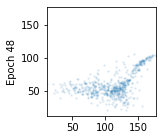

Epoch 49 elbo -10.145558


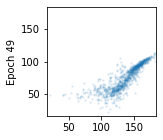

Reconstruction:


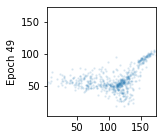

Epoch 50 elbo -10.394478


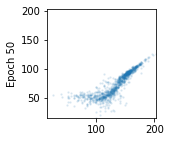

Reconstruction:


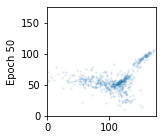

Epoch 51 elbo -10.071754


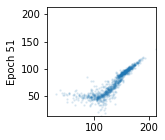

Reconstruction:


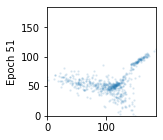

Epoch 52 elbo -10.208629


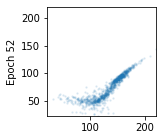

Reconstruction:


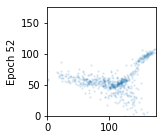

Epoch 53 elbo -10.006311


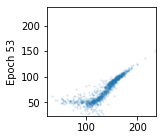

Reconstruction:


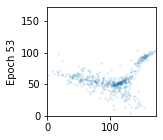

Epoch 54 elbo -10.040039


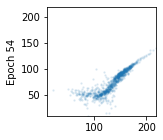

Reconstruction:


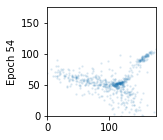

Epoch 55 elbo -10.114781


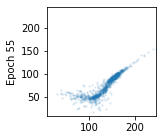

Reconstruction:


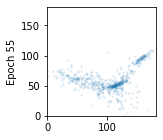

Epoch 56 elbo -10.0805025


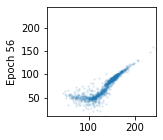

Reconstruction:


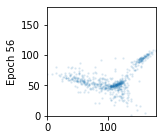

Epoch 57 elbo -10.097474


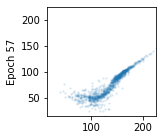

Reconstruction:


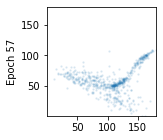

Epoch 58 elbo -10.048941


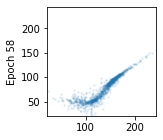

Reconstruction:


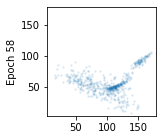

Epoch 59 elbo -9.889417


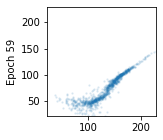

Reconstruction:


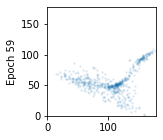

Epoch 60 elbo -9.956758


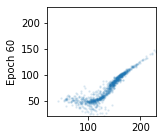

Reconstruction:


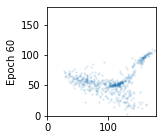

Epoch 61 elbo -10.029041


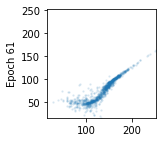

Reconstruction:


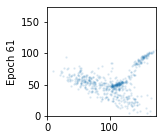

Epoch 62 elbo -10.047731


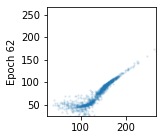

Reconstruction:


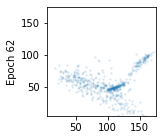

Epoch 63 elbo -9.871123


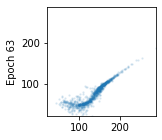

Reconstruction:


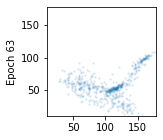

Epoch 64 elbo -10.127104


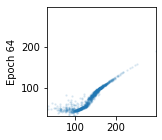

Reconstruction:


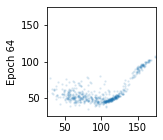

Epoch 65 elbo -10.067945


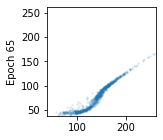

Reconstruction:


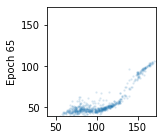

Epoch 66 elbo -10.055618


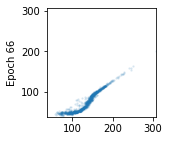

Reconstruction:


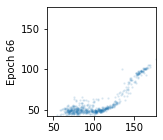

Epoch 67 elbo -10.023411


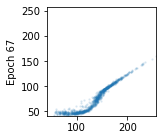

Reconstruction:


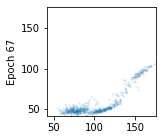

Epoch 68 elbo -10.105314


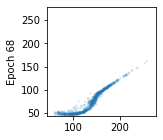

Reconstruction:


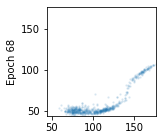

Epoch 69 elbo -9.954518


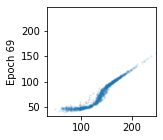

Reconstruction:


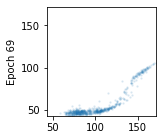

Epoch 70 elbo -10.121473


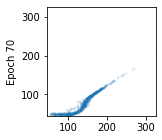

Reconstruction:


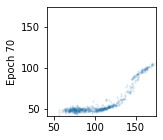

Epoch 71 elbo -10.012223


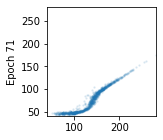

Reconstruction:


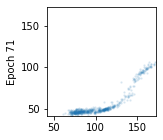

Epoch 72 elbo -9.950156


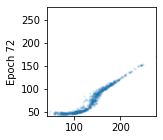

Reconstruction:


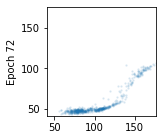

Epoch 73 elbo -9.966163


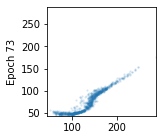

Reconstruction:


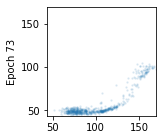

Epoch 74 elbo -9.986935


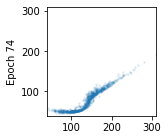

Reconstruction:


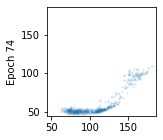

Epoch 75 elbo -9.887396


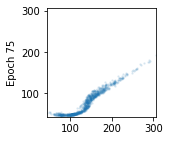

Reconstruction:


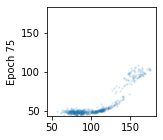

Epoch 76 elbo -9.969062


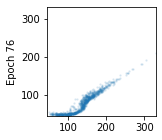

Reconstruction:


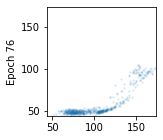

Epoch 77 elbo -9.887352


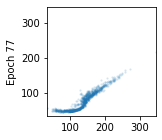

Reconstruction:


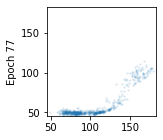

Epoch 78 elbo -9.890833


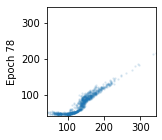

Reconstruction:


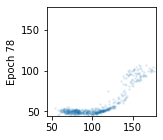

Epoch 79 elbo -9.895739


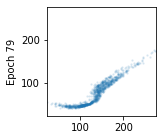

Reconstruction:


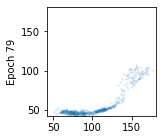

Epoch 80 elbo -9.876455


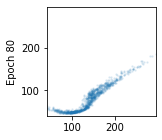

Reconstruction:


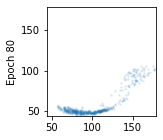

Epoch 81 elbo -9.828684


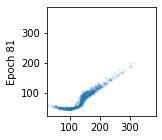

Reconstruction:


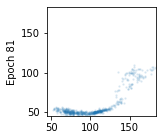

Epoch 82 elbo -9.965268


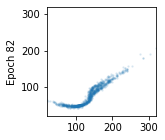

Reconstruction:


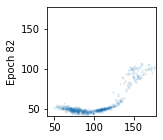

Epoch 83 elbo -9.869403


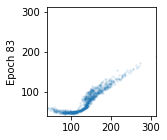

Reconstruction:


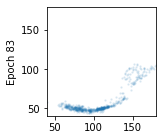

Epoch 84 elbo -9.932255


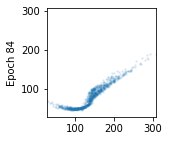

Reconstruction:


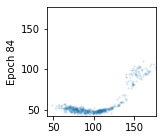

Epoch 85 elbo -9.872945


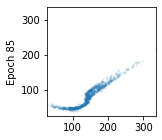

Reconstruction:


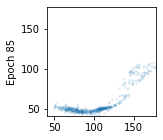

Epoch 86 elbo -9.8842745


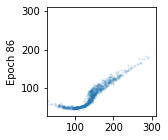

Reconstruction:


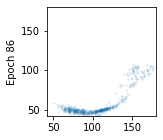

Epoch 87 elbo -9.878781


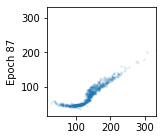

Reconstruction:


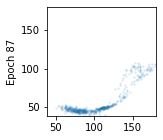

Epoch 88 elbo -9.789738


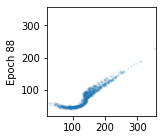

Reconstruction:


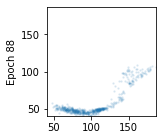

Epoch 89 elbo -9.897347


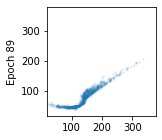

Reconstruction:


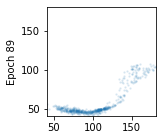

Epoch 90 elbo -9.811891


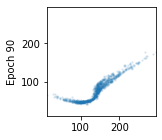

Reconstruction:


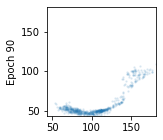

Epoch 91 elbo -9.700014


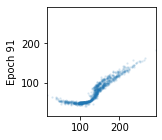

Reconstruction:


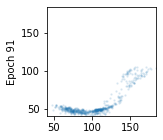

Epoch 92 elbo -9.835753


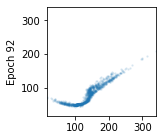

Reconstruction:


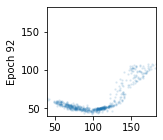

Epoch 93 elbo -9.754477


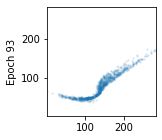

Reconstruction:


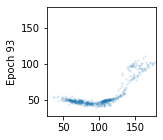

Epoch 94 elbo -10.013161


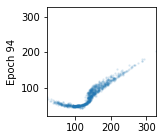

Reconstruction:


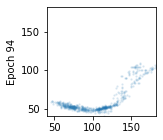

Epoch 95 elbo -10.008109


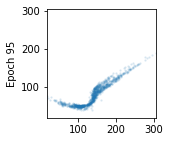

Reconstruction:


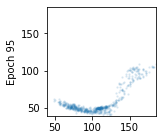

Epoch 96 elbo -9.828229


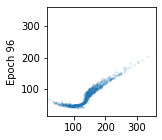

Reconstruction:


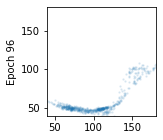

Epoch 97 elbo -9.826569


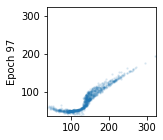

Reconstruction:


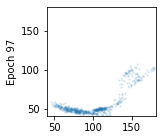

Epoch 98 elbo -9.8891


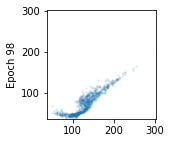

Reconstruction:


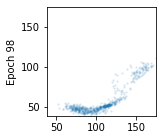

Epoch 99 elbo -9.825456


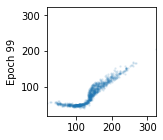

Reconstruction:


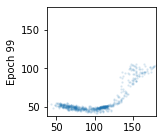

Epoch 100 elbo -9.793137


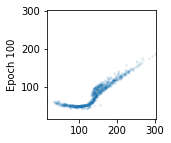

Reconstruction:


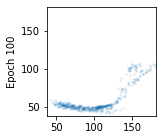

Epoch 101 elbo -9.738932


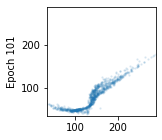

Reconstruction:


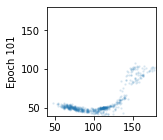

Epoch 102 elbo -9.682092


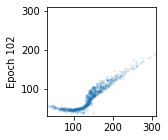

Reconstruction:


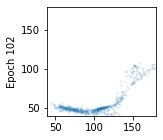

Epoch 103 elbo -9.859392


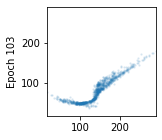

Reconstruction:


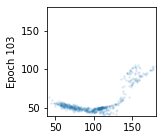

Epoch 104 elbo -9.762714


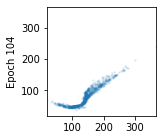

Reconstruction:


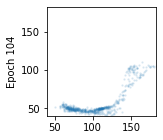

Epoch 105 elbo -9.718489


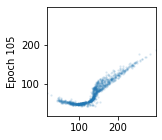

Reconstruction:


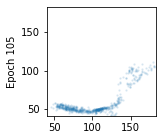

Epoch 106 elbo -9.907762


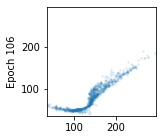

Reconstruction:


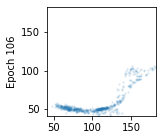

Epoch 107 elbo -9.753561


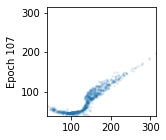

Reconstruction:


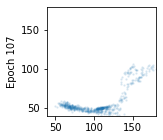

Epoch 108 elbo -9.692679


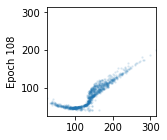

Reconstruction:


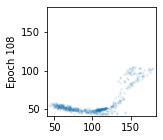

Epoch 109 elbo -9.919808


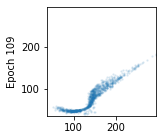

Reconstruction:


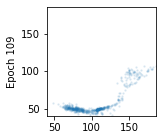

Epoch 110 elbo -9.757023


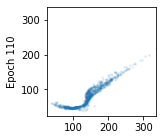

Reconstruction:


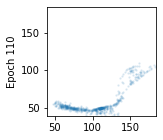

Epoch 111 elbo -9.767129


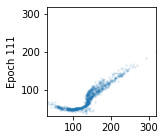

Reconstruction:


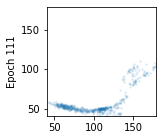

Epoch 112 elbo -9.736936


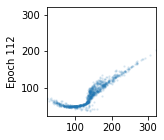

Reconstruction:


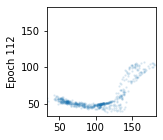

Epoch 113 elbo -9.793242


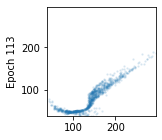

Reconstruction:


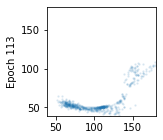

Epoch 114 elbo -9.620097


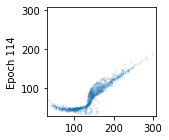

Reconstruction:


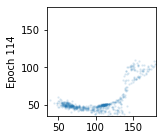

Epoch 115 elbo -9.649401


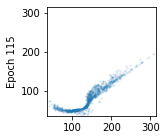

Reconstruction:


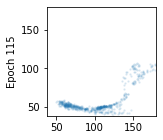

Epoch 116 elbo -9.78326


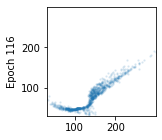

Reconstruction:


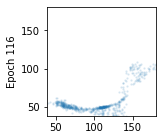

Epoch 117 elbo -9.676491


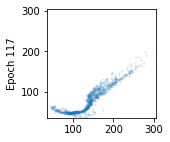

Reconstruction:


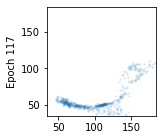

Epoch 118 elbo -9.62853


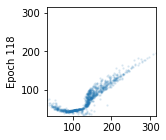

Reconstruction:


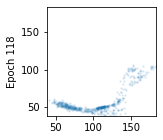

Epoch 119 elbo -9.747482


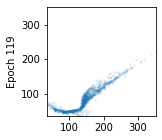

Reconstruction:


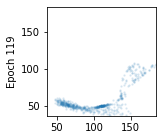

Epoch 120 elbo -9.685916


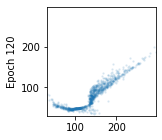

Reconstruction:


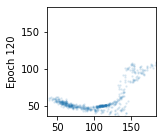

Epoch 121 elbo -9.76153


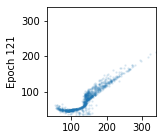

Reconstruction:


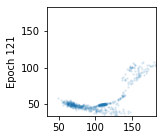

Epoch 122 elbo -9.703898


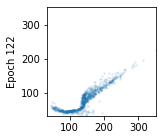

Reconstruction:


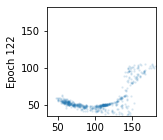

Epoch 123 elbo -9.690561


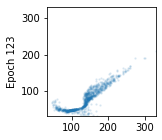

Reconstruction:


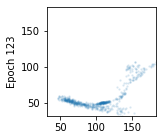

Epoch 124 elbo -9.596899


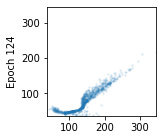

Reconstruction:


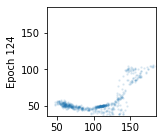

Epoch 125 elbo -9.67894


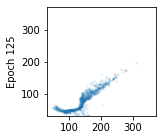

Reconstruction:


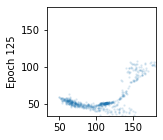

Epoch 126 elbo -9.888156


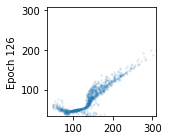

Reconstruction:


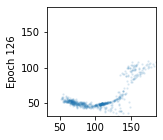

Epoch 127 elbo -9.661817


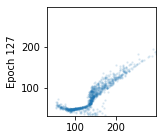

Reconstruction:


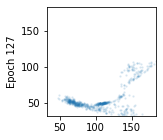

Epoch 128 elbo -9.687822


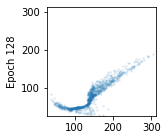

Reconstruction:


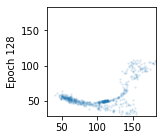

Epoch 129 elbo -9.710969


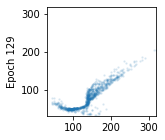

Reconstruction:


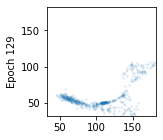

Epoch 130 elbo -9.734832


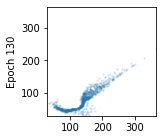

Reconstruction:


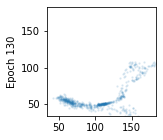

Epoch 131 elbo -9.594504


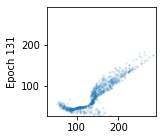

Reconstruction:


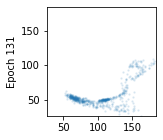

Epoch 132 elbo -9.638641


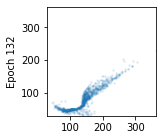

Reconstruction:


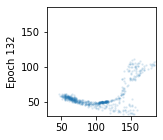

Epoch 133 elbo -9.59104


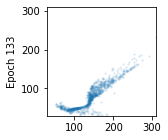

Reconstruction:


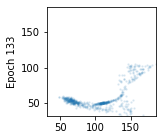

Epoch 134 elbo -9.813895


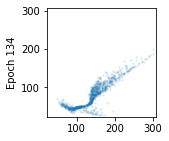

Reconstruction:


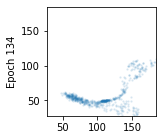

Epoch 135 elbo -9.721976


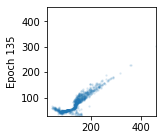

Reconstruction:


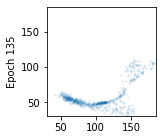

Epoch 136 elbo -9.641367


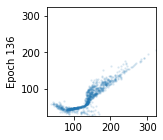

Reconstruction:


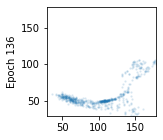

Epoch 137 elbo -9.711631


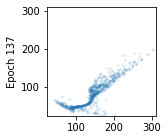

Reconstruction:


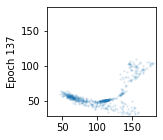

Epoch 138 elbo -9.690044


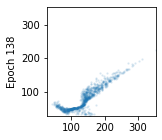

Reconstruction:


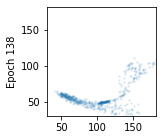

Epoch 139 elbo -9.590889


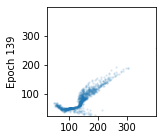

Reconstruction:


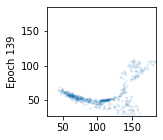

Epoch 140 elbo -9.6315155


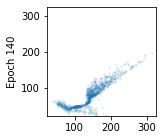

Reconstruction:


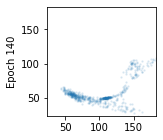

Epoch 141 elbo -9.492645


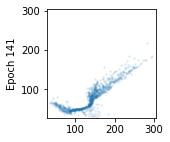

Reconstruction:


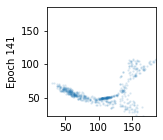

Epoch 142 elbo -9.558296


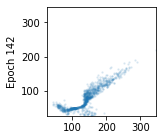

Reconstruction:


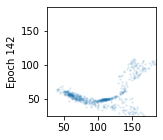

Epoch 143 elbo -9.6481


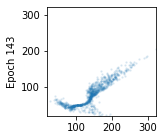

Reconstruction:


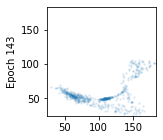

Epoch 144 elbo -9.56631


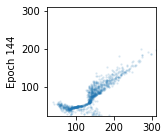

Reconstruction:


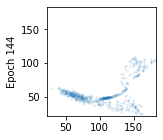

Epoch 145 elbo -9.676551


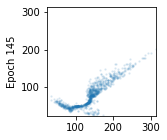

Reconstruction:


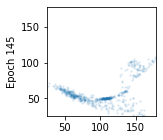

Epoch 146 elbo -9.626343


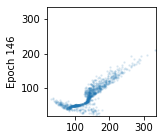

Reconstruction:


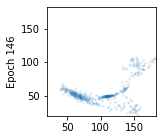

Epoch 147 elbo -9.603802


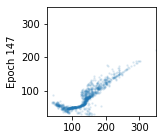

Reconstruction:


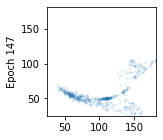

Epoch 148 elbo -9.57092


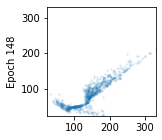

Reconstruction:


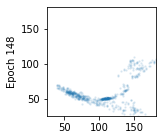

Epoch 149 elbo -9.572069


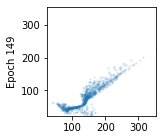

Reconstruction:


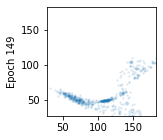

Epoch 150 elbo -9.545924


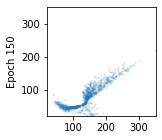

Reconstruction:


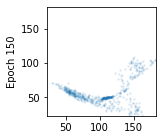

Epoch 151 elbo -9.579819


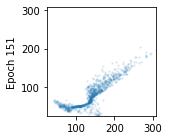

Reconstruction:


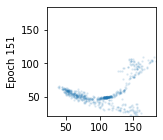

Epoch 152 elbo -9.509873


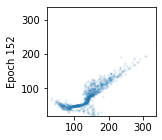

Reconstruction:


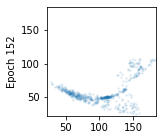

Epoch 153 elbo -9.63244


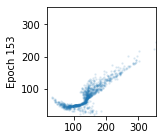

Reconstruction:


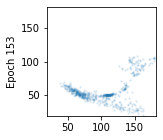

Epoch 154 elbo -9.593869


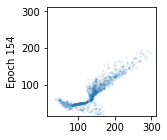

Reconstruction:


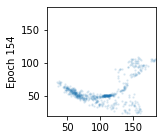

Epoch 155 elbo -9.544323


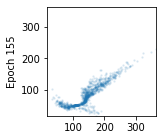

Reconstruction:


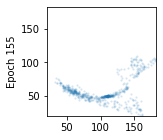

Epoch 156 elbo -9.475711


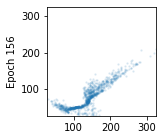

Reconstruction:


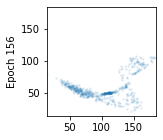

Epoch 157 elbo -9.530939


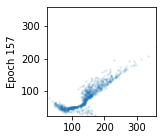

Reconstruction:


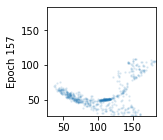

Epoch 158 elbo -9.539956


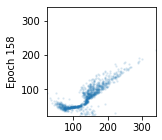

Reconstruction:


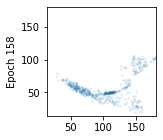

Epoch 159 elbo -9.546314


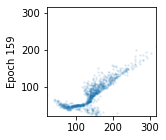

Reconstruction:


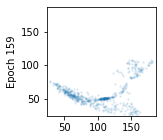

Epoch 160 elbo -9.518805


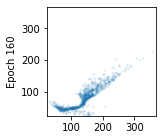

Reconstruction:


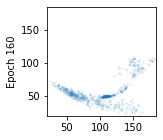

Epoch 161 elbo -9.537348


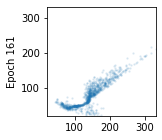

Reconstruction:


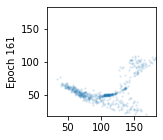

Epoch 162 elbo -9.459961


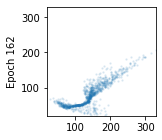

Reconstruction:


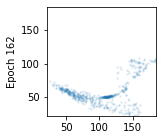

Epoch 163 elbo -9.456786


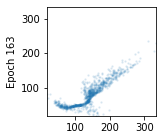

Reconstruction:


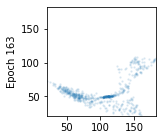

Epoch 164 elbo -9.483929


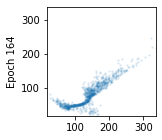

Reconstruction:


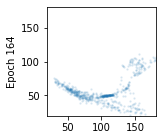

Epoch 165 elbo -9.509324


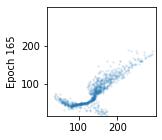

Reconstruction:


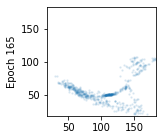

Epoch 166 elbo -9.506826


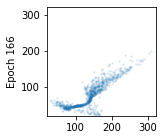

Reconstruction:


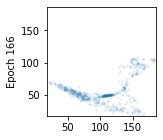

Epoch 167 elbo -9.54508


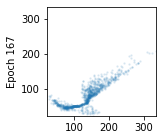

Reconstruction:


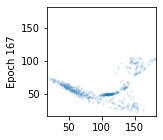

Epoch 168 elbo -9.479517


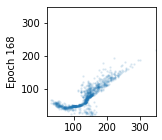

Reconstruction:


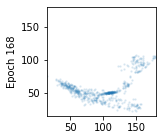

Epoch 169 elbo -9.555467


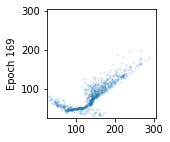

Reconstruction:


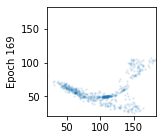

Epoch 170 elbo -9.462788


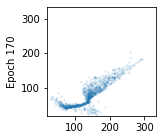

Reconstruction:


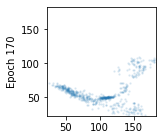

Epoch 171 elbo -9.496896


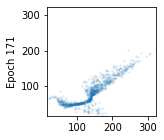

Reconstruction:


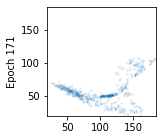

Epoch 172 elbo -9.442002


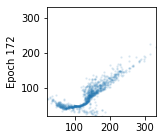

Reconstruction:


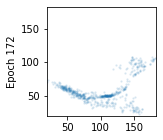

Epoch 173 elbo -9.544913


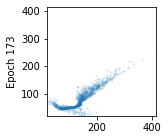

Reconstruction:


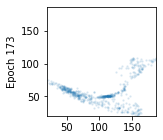

Epoch 174 elbo -9.553923


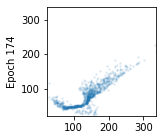

Reconstruction:


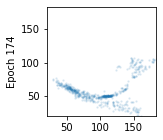

Epoch 175 elbo -9.4573765


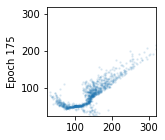

Reconstruction:


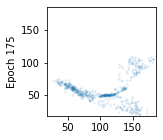

Epoch 176 elbo -9.500236


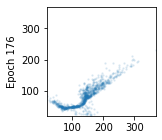

Reconstruction:


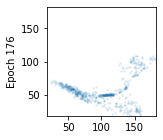

Epoch 177 elbo -9.433501


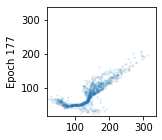

Reconstruction:


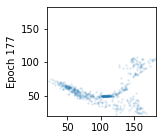

Epoch 178 elbo -9.44867


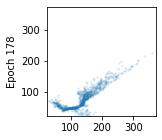

Reconstruction:


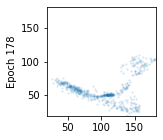

Epoch 179 elbo -9.402075


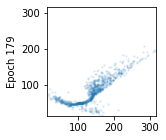

Reconstruction:


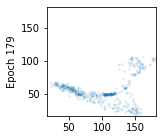

Epoch 180 elbo -9.4138365


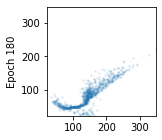

Reconstruction:


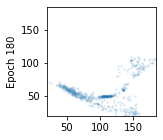

Epoch 181 elbo -9.521678


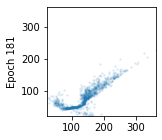

Reconstruction:


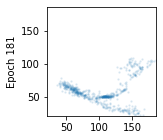

Epoch 182 elbo -9.407298


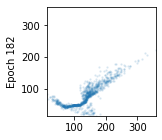

Reconstruction:


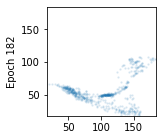

Epoch 183 elbo -9.842471


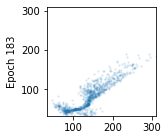

Reconstruction:


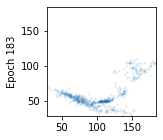

Epoch 184 elbo -9.422686


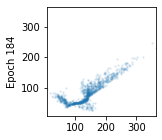

Reconstruction:


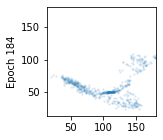

Epoch 185 elbo -9.289683


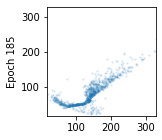

Reconstruction:


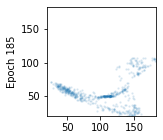

Epoch 186 elbo -9.51979


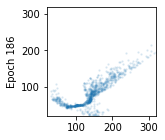

Reconstruction:


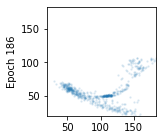

Epoch 187 elbo -9.44242


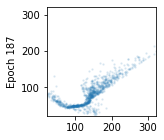

Reconstruction:


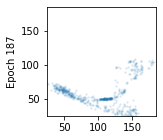

Epoch 188 elbo -9.28819


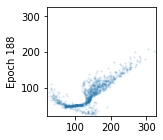

Reconstruction:


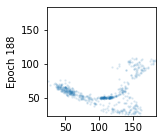

Epoch 189 elbo -9.378732


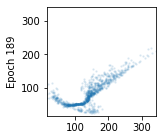

Reconstruction:


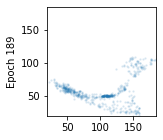

Epoch 190 elbo -9.3370695


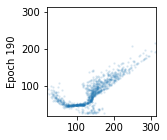

Reconstruction:


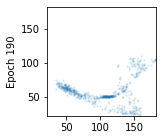

Epoch 191 elbo -9.251807


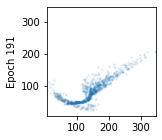

Reconstruction:


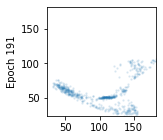

Epoch 192 elbo -9.449477


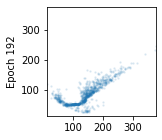

Reconstruction:


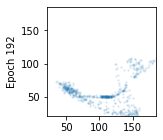

Epoch 193 elbo -9.395869


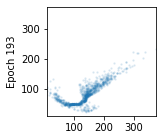

Reconstruction:


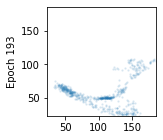

Epoch 194 elbo -9.341997


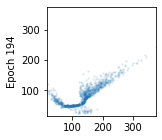

Reconstruction:


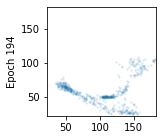

Epoch 195 elbo -9.3396435


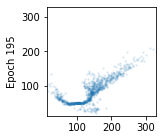

Reconstruction:


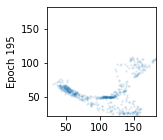

Epoch 196 elbo -9.290687


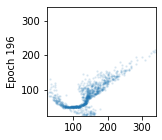

Reconstruction:


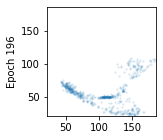

Epoch 197 elbo -9.302543


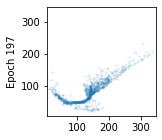

Reconstruction:


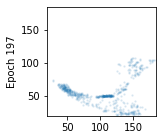

Epoch 198 elbo -9.406623


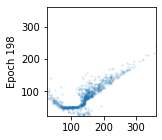

Reconstruction:


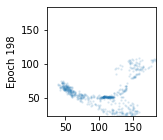

Epoch 199 elbo -9.392051


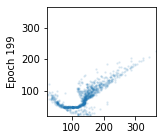

Reconstruction:


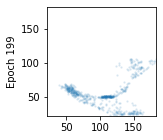

Epoch 200 elbo -9.507564


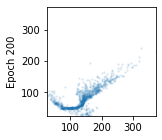

Reconstruction:


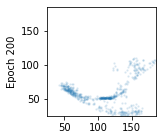

Epoch 201 elbo -9.448254


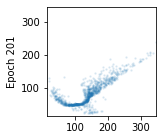

Reconstruction:


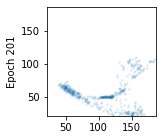

Epoch 202 elbo -9.383725


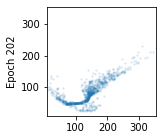

Reconstruction:


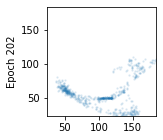

Epoch 203 elbo -9.723625


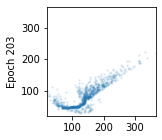

Reconstruction:


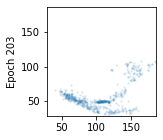

Epoch 204 elbo -9.3046255


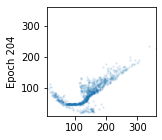

Reconstruction:


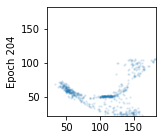

Epoch 205 elbo -9.248799


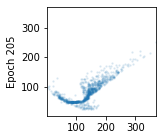

Reconstruction:


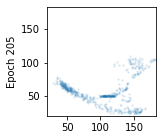

Epoch 206 elbo -9.230839


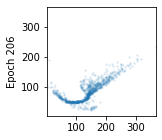

Reconstruction:


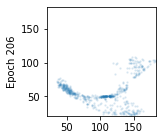

Epoch 207 elbo -9.336923


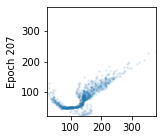

Reconstruction:


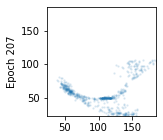

Epoch 208 elbo -9.466792


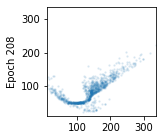

Reconstruction:


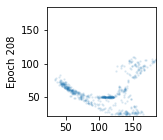

Epoch 209 elbo -9.27911


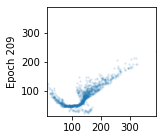

Reconstruction:


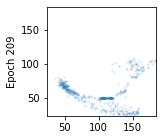

Epoch 210 elbo -9.115957


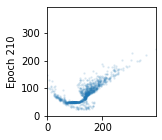

Reconstruction:


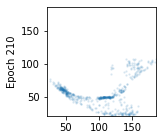

Epoch 211 elbo -9.312112


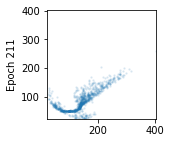

Reconstruction:


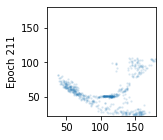

Epoch 212 elbo -9.42084


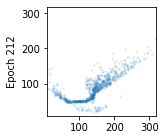

Reconstruction:


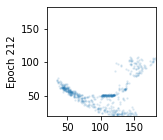

Epoch 213 elbo -9.29298


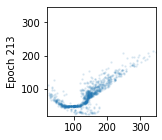

Reconstruction:


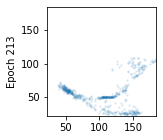

Epoch 214 elbo -9.3456135


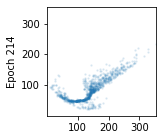

Reconstruction:


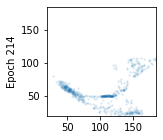

Epoch 215 elbo -9.229128


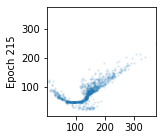

Reconstruction:


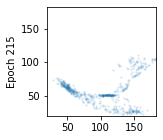

Epoch 216 elbo -9.397303


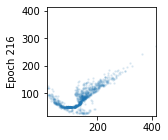

Reconstruction:


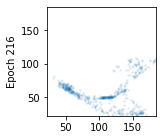

Epoch 217 elbo -9.277528


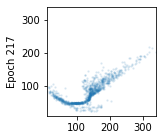

Reconstruction:


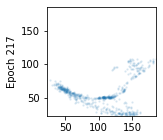

Epoch 218 elbo -9.245589


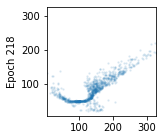

Reconstruction:


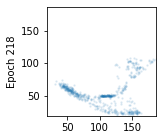

Epoch 219 elbo -9.229552


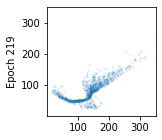

Reconstruction:


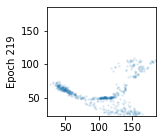

Epoch 220 elbo -9.247778


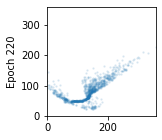

Reconstruction:


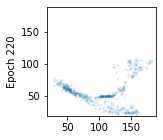

Epoch 221 elbo -9.25429


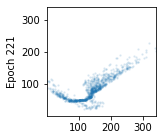

Reconstruction:


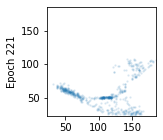

Epoch 222 elbo -9.261555


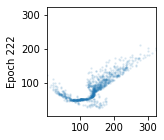

Reconstruction:


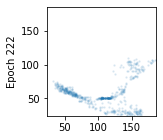

Epoch 223 elbo -9.261431


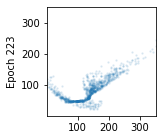

Reconstruction:


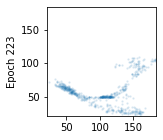

Epoch 224 elbo -9.370287


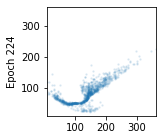

Reconstruction:


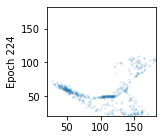

Epoch 225 elbo -10.147395


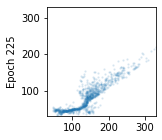

Reconstruction:


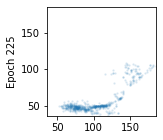

Epoch 226 elbo -9.524064


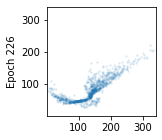

Reconstruction:


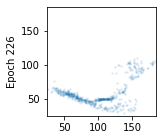

Epoch 227 elbo -9.245803


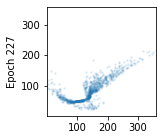

Reconstruction:


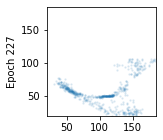

Epoch 228 elbo -9.387287


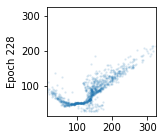

Reconstruction:


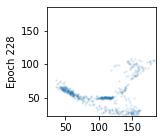

Epoch 229 elbo -9.4548855


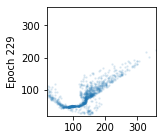

Reconstruction:


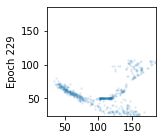

Epoch 230 elbo -9.319594


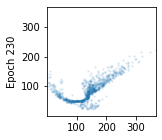

Reconstruction:


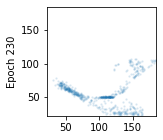

Epoch 231 elbo -9.261878


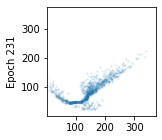

Reconstruction:


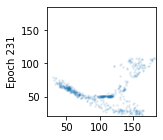

Epoch 232 elbo -9.241471


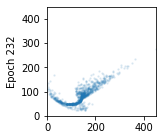

Reconstruction:


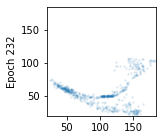

Epoch 233 elbo -9.189427


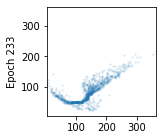

Reconstruction:


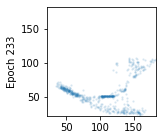

Epoch 234 elbo -9.134271


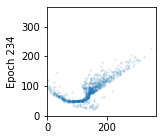

Reconstruction:


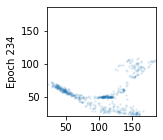

Epoch 235 elbo -9.135189


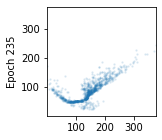

Reconstruction:


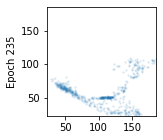

Epoch 236 elbo -9.278604


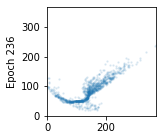

Reconstruction:


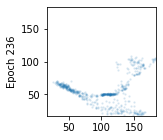

Epoch 237 elbo -9.217959


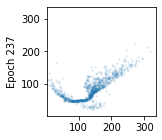

Reconstruction:


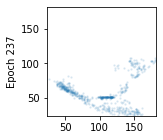

Epoch 238 elbo -9.244014


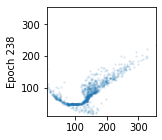

Reconstruction:


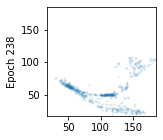

Epoch 239 elbo -9.272275


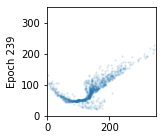

Reconstruction:


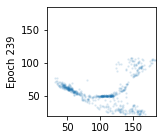

Epoch 240 elbo -9.163977


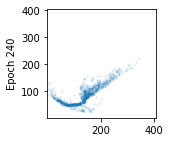

Reconstruction:


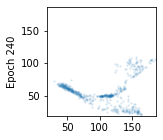

Epoch 241 elbo -9.371693


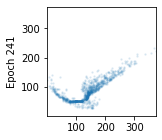

Reconstruction:


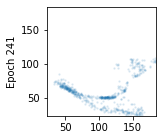

Epoch 242 elbo -9.179571


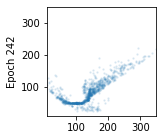

Reconstruction:


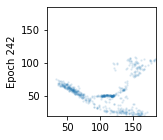

Epoch 243 elbo -9.154183


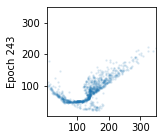

Reconstruction:


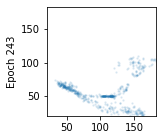

Epoch 244 elbo -9.196063


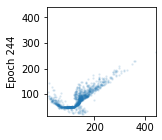

Reconstruction:


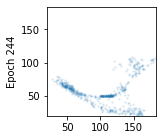

Epoch 245 elbo -9.681855


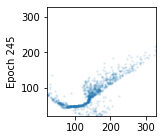

Reconstruction:


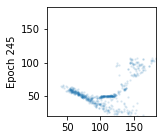

Epoch 246 elbo -9.123839


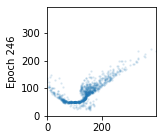

Reconstruction:


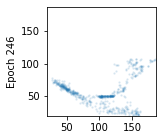

Epoch 247 elbo -9.2106495


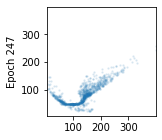

Reconstruction:


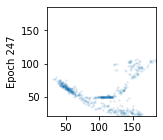

Epoch 248 elbo -9.203727


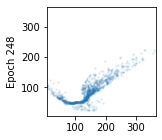

Reconstruction:


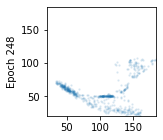

Epoch 249 elbo -9.126238


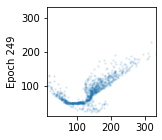

Reconstruction:


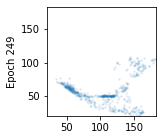

Epoch 250 elbo -9.188918


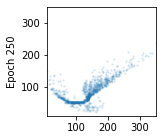

Reconstruction:


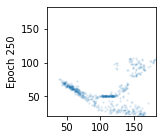

Epoch 251 elbo -9.235622


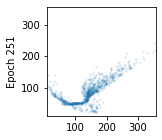

Reconstruction:


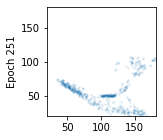

Epoch 252 elbo -9.161544


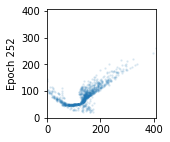

Reconstruction:


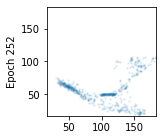

Epoch 253 elbo -9.267154


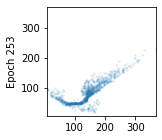

Reconstruction:


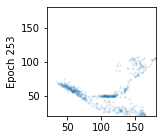

Epoch 254 elbo -9.235772


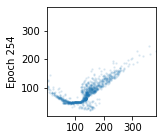

Reconstruction:


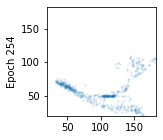

Epoch 255 elbo -9.223609


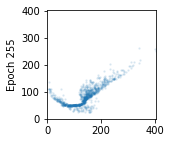

Reconstruction:


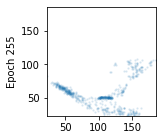

Epoch 256 elbo -9.275213


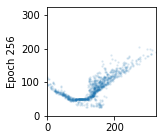

Reconstruction:


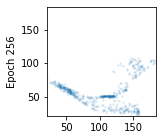

Epoch 257 elbo -9.168465


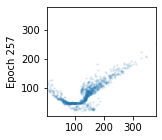

Reconstruction:


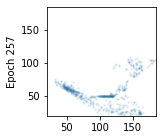

Epoch 258 elbo -9.190882


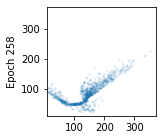

Reconstruction:


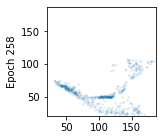

Epoch 259 elbo -9.253271


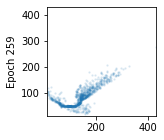

Reconstruction:


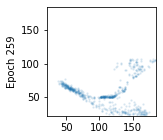

Epoch 260 elbo -9.223985


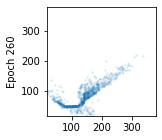

Reconstruction:


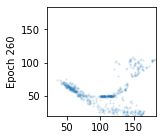

Epoch 261 elbo -9.509929


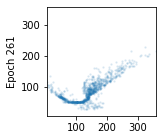

Reconstruction:


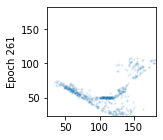

Epoch 262 elbo -9.323924


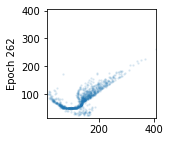

Reconstruction:


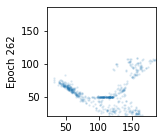

Epoch 263 elbo -9.39354


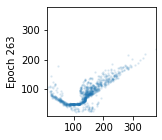

Reconstruction:


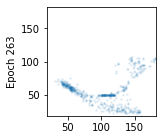

Epoch 264 elbo -9.182246


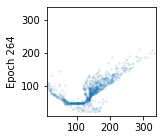

Reconstruction:


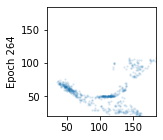

Epoch 265 elbo -9.312885


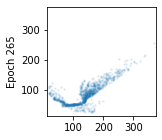

Reconstruction:


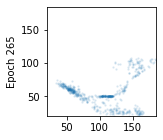

Epoch 266 elbo -9.234565


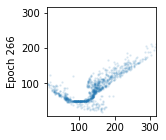

Reconstruction:


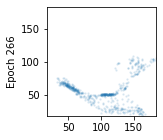

Epoch 267 elbo -9.175823


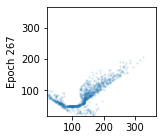

Reconstruction:


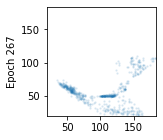

Epoch 268 elbo -9.191934


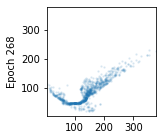

Reconstruction:


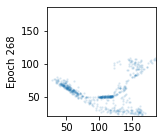

Epoch 269 elbo -9.202458


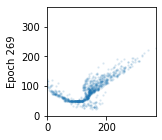

Reconstruction:


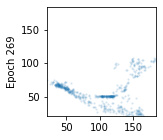

Epoch 270 elbo -9.296943


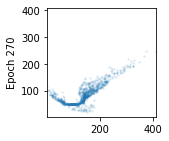

Reconstruction:


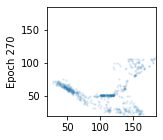

Epoch 271 elbo -9.769032


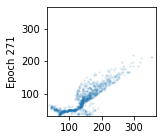

Reconstruction:


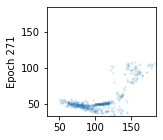

Epoch 272 elbo -9.23586


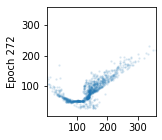

Reconstruction:


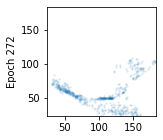

Epoch 273 elbo -9.236534


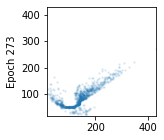

Reconstruction:


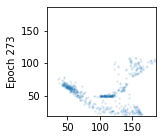

Epoch 274 elbo -9.125836


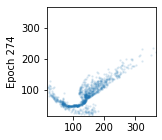

Reconstruction:


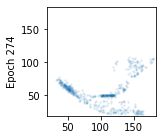

Epoch 275 elbo -9.12693


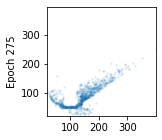

Reconstruction:


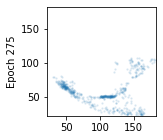

Epoch 276 elbo -9.222152


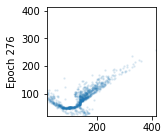

Reconstruction:


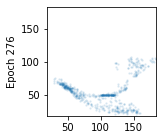

Epoch 277 elbo -9.22306


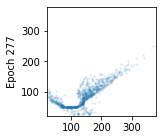

Reconstruction:


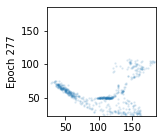

Epoch 278 elbo -9.361337


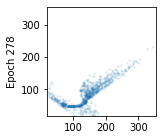

Reconstruction:


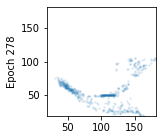

Epoch 279 elbo -9.202777


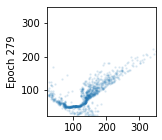

Reconstruction:


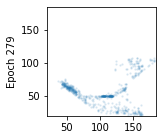

Epoch 280 elbo -9.317768


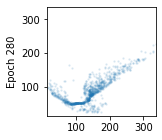

Reconstruction:


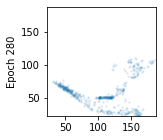

Epoch 281 elbo -9.17014


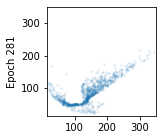

Reconstruction:


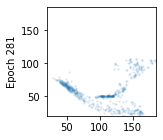

Epoch 282 elbo -9.967066


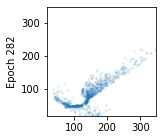

Reconstruction:


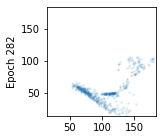

Epoch 283 elbo -9.153184


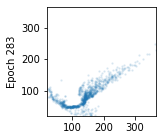

Reconstruction:


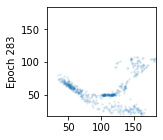

Epoch 284 elbo -9.408221


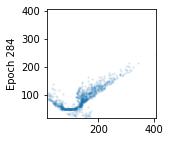

Reconstruction:


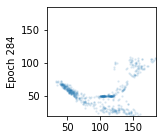

Epoch 285 elbo -9.206631


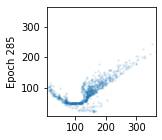

Reconstruction:


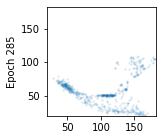

Epoch 286 elbo -9.854969


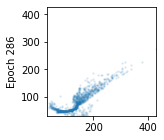

Reconstruction:


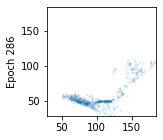

Epoch 287 elbo -9.279541


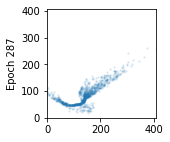

Reconstruction:


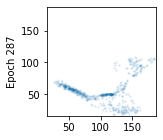

Epoch 288 elbo -9.181815


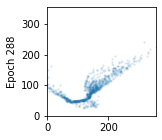

Reconstruction:


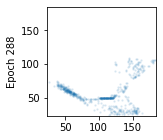

Epoch 289 elbo -9.252739


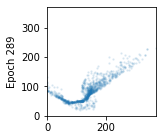

Reconstruction:


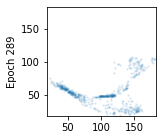

Epoch 290 elbo -9.25675


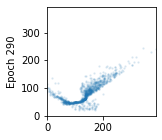

Reconstruction:


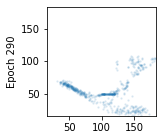

Epoch 291 elbo -9.217274


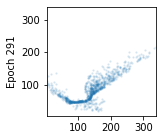

Reconstruction:


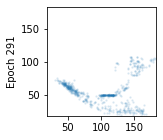

Epoch 292 elbo -9.275395


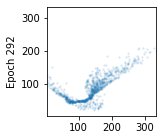

Reconstruction:


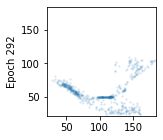

Epoch 293 elbo -9.139842


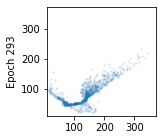

Reconstruction:


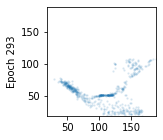

Epoch 294 elbo -9.18365


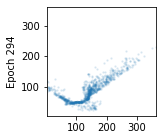

Reconstruction:


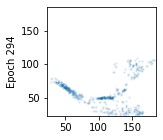

Epoch 295 elbo -9.16086


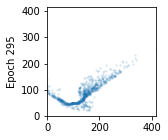

Reconstruction:


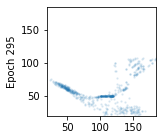

Epoch 296 elbo -9.110121


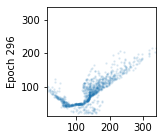

Reconstruction:


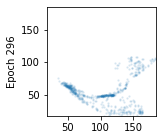

Epoch 297 elbo -9.192036


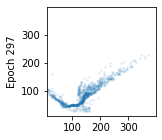

Reconstruction:


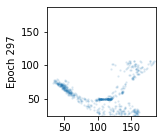

Epoch 298 elbo -9.204859


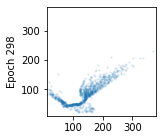

Reconstruction:


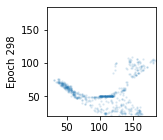

Epoch 299 elbo -9.213722


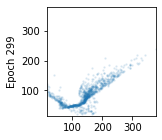

Reconstruction:


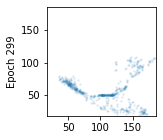

Epoch 300 elbo -9.081157


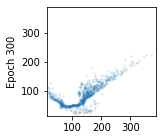

Reconstruction:


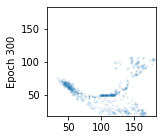

Epoch 301 elbo -9.183454


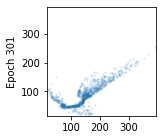

Reconstruction:


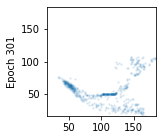

Epoch 302 elbo -9.191012


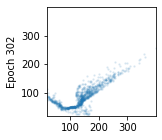

Reconstruction:


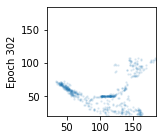

Epoch 303 elbo -9.114655


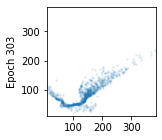

Reconstruction:


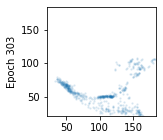

Epoch 304 elbo -9.331058


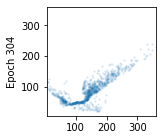

Reconstruction:


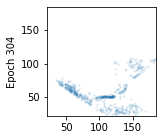

Epoch 305 elbo -9.241952


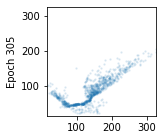

Reconstruction:


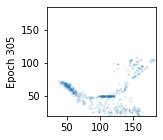

Epoch 306 elbo -9.158429


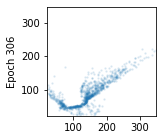

Reconstruction:


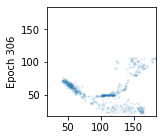

Epoch 307 elbo -9.114526


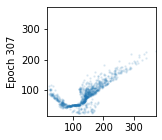

Reconstruction:


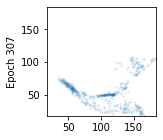

Epoch 308 elbo -9.188781


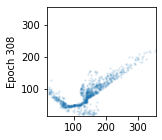

Reconstruction:


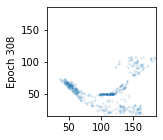

Epoch 309 elbo -9.039855


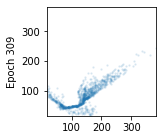

Reconstruction:


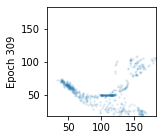

Epoch 310 elbo -9.176138


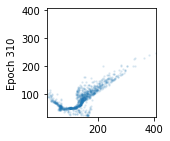

Reconstruction:


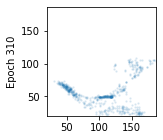

Epoch 311 elbo -9.193803


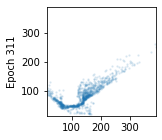

Reconstruction:


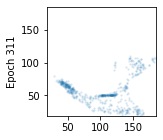

Epoch 312 elbo -9.086748


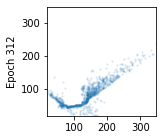

Reconstruction:


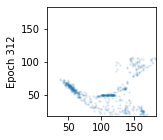

Epoch 313 elbo -9.127695


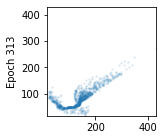

Reconstruction:


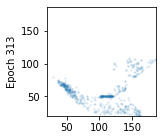

Epoch 314 elbo -9.095427


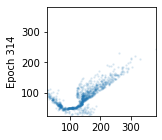

Reconstruction:


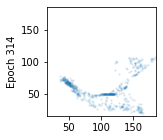

Epoch 315 elbo -9.140386


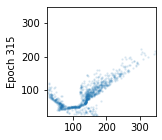

Reconstruction:


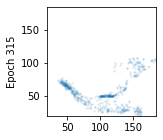

Epoch 316 elbo -9.176804


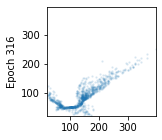

Reconstruction:


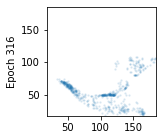

Epoch 317 elbo -9.155812


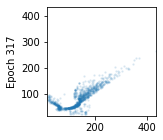

Reconstruction:


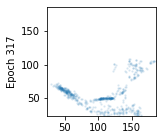

Epoch 318 elbo -9.082409


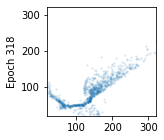

Reconstruction:


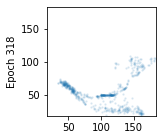

Epoch 319 elbo -9.18843


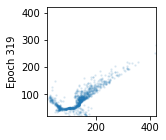

Reconstruction:


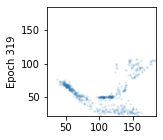

Epoch 320 elbo -9.223497


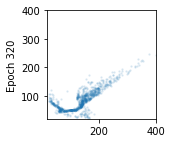

Reconstruction:


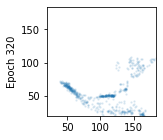

Epoch 321 elbo -9.035677


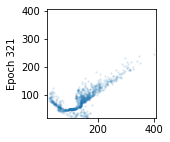

Reconstruction:


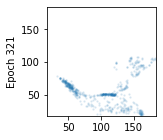

Epoch 322 elbo -9.113764


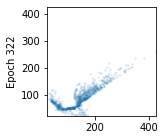

Reconstruction:


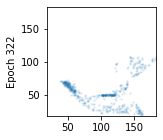

Epoch 323 elbo -9.823133


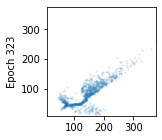

Reconstruction:


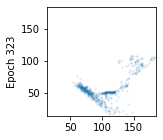

Epoch 324 elbo -9.186814


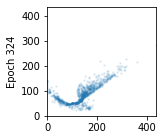

Reconstruction:


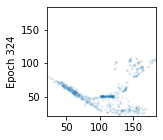

Epoch 325 elbo -9.249726


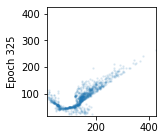

Reconstruction:


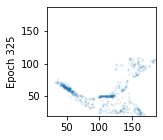

Epoch 326 elbo -9.180588


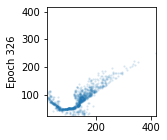

Reconstruction:


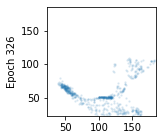

Epoch 327 elbo -9.250708


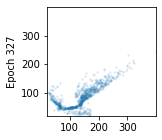

Reconstruction:


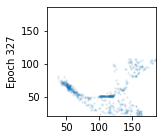

Epoch 328 elbo -9.064997


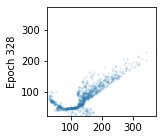

Reconstruction:


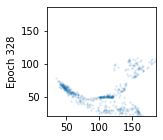

Epoch 329 elbo -9.426499


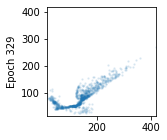

Reconstruction:


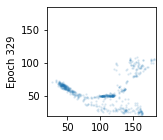

Epoch 330 elbo -9.094411


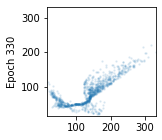

Reconstruction:


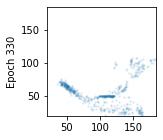

Epoch 331 elbo -9.159155


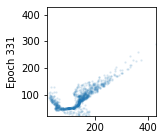

Reconstruction:


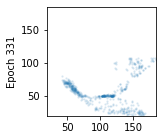

Epoch 332 elbo -9.054201


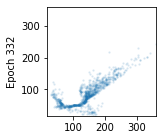

Reconstruction:


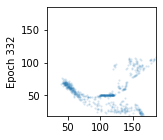

Epoch 333 elbo -9.162692


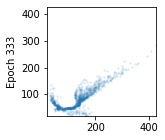

Reconstruction:


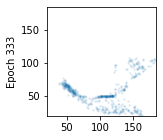

Epoch 334 elbo -9.236314


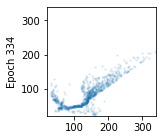

Reconstruction:


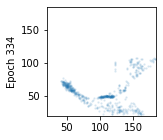

Epoch 335 elbo -9.029508


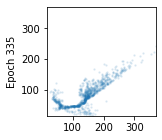

Reconstruction:


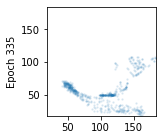

Epoch 336 elbo -9.29379


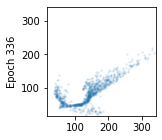

Reconstruction:


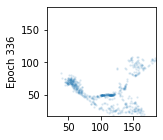

Epoch 337 elbo -9.25877


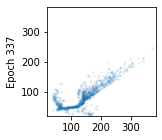

Reconstruction:


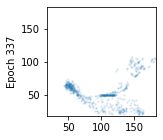

Epoch 338 elbo -9.077019


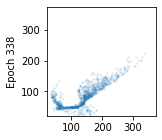

Reconstruction:


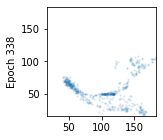

Epoch 339 elbo -9.09671


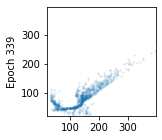

Reconstruction:


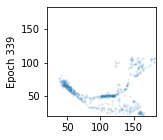

Epoch 340 elbo -9.201716


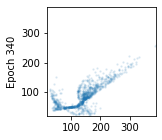

Reconstruction:


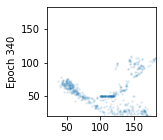

Epoch 341 elbo -9.147585


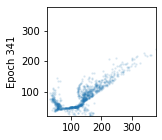

Reconstruction:


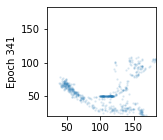

Epoch 342 elbo -9.074285


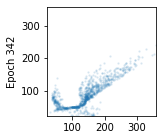

Reconstruction:


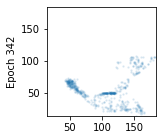

Epoch 343 elbo -9.021403


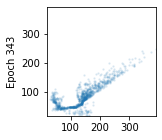

Reconstruction:


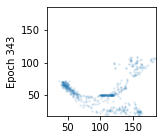

Epoch 344 elbo -8.957036


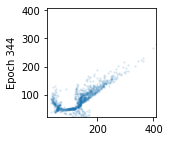

Reconstruction:


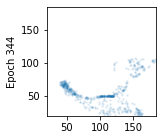

Epoch 345 elbo -9.0340605


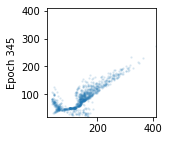

Reconstruction:


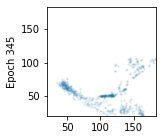

Epoch 346 elbo -8.941737


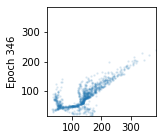

Reconstruction:


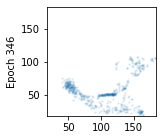

Epoch 347 elbo -9.5158415


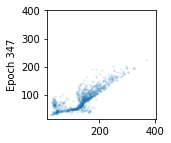

Reconstruction:


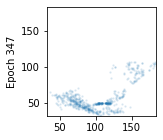

Epoch 348 elbo -9.123187


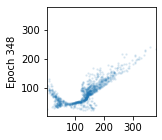

Reconstruction:


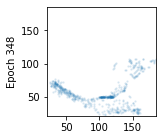

Epoch 349 elbo -9.096671


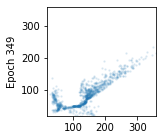

Reconstruction:


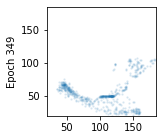

Epoch 350 elbo -9.168941


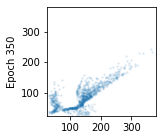

Reconstruction:


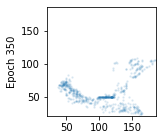

Epoch 351 elbo -9.016906


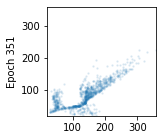

Reconstruction:


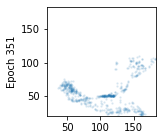

Epoch 352 elbo -9.071531


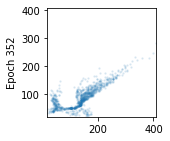

Reconstruction:


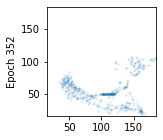

Epoch 353 elbo -9.022215


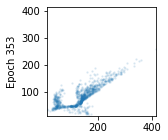

Reconstruction:


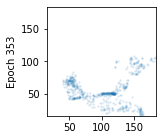

Epoch 354 elbo -9.065565


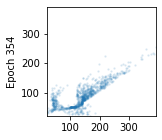

Reconstruction:


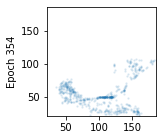

Epoch 355 elbo -8.9666195


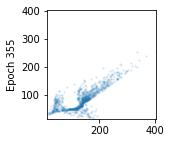

Reconstruction:


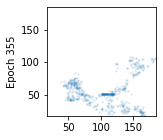

Epoch 356 elbo -8.922114


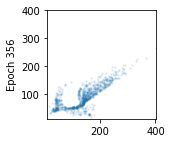

Reconstruction:


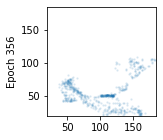

Epoch 357 elbo -8.956237


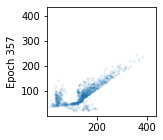

Reconstruction:


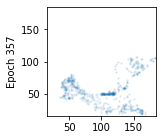

Epoch 358 elbo -8.828072


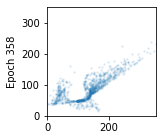

Reconstruction:


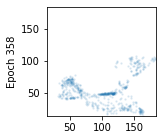

Epoch 359 elbo -8.91325


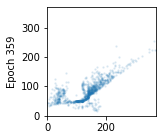

Reconstruction:


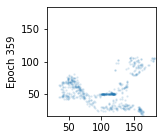

Epoch 360 elbo -8.859589


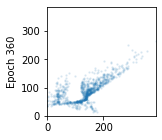

Reconstruction:


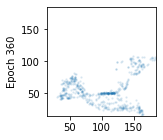

Epoch 361 elbo -8.945484


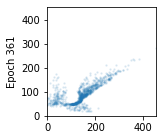

Reconstruction:


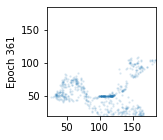

Epoch 362 elbo -8.926874


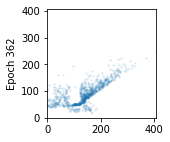

Reconstruction:


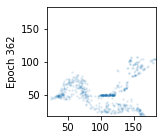

Epoch 363 elbo -8.977412


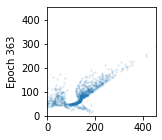

Reconstruction:


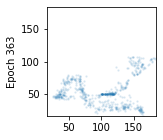

Epoch 364 elbo -9.308996


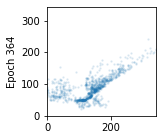

Reconstruction:


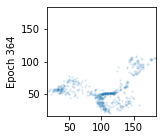

Epoch 365 elbo -9.180174


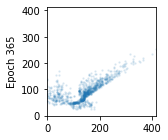

Reconstruction:


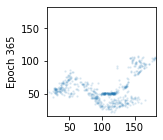

Epoch 366 elbo -8.968077


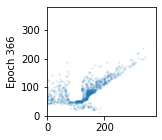

Reconstruction:


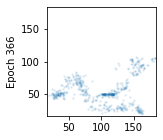

Epoch 367 elbo -8.781403


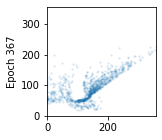

Reconstruction:


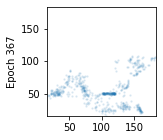

Epoch 368 elbo -8.792821


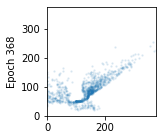

Reconstruction:


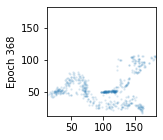

Epoch 369 elbo -8.723384


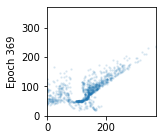

Reconstruction:


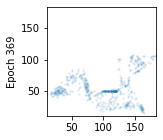

Epoch 370 elbo -8.924697


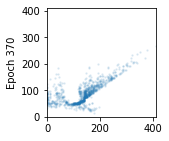

Reconstruction:


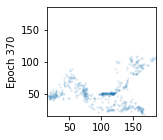

Epoch 371 elbo -8.790667


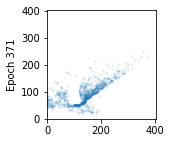

Reconstruction:


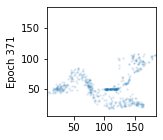

Epoch 372 elbo -8.840587


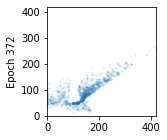

Reconstruction:


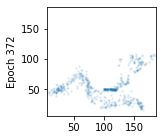

Epoch 373 elbo -9.232116


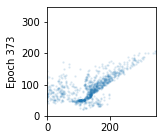

Reconstruction:


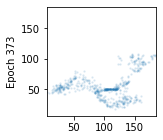

Epoch 374 elbo -8.687668


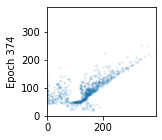

Reconstruction:


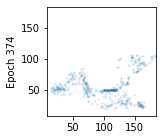

Epoch 375 elbo -8.756671


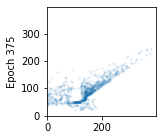

Reconstruction:


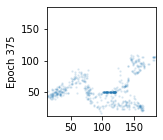

Epoch 376 elbo -8.852202


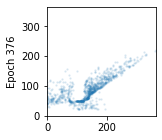

Reconstruction:


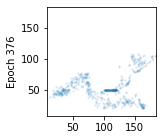

Epoch 377 elbo -8.776985


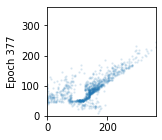

Reconstruction:


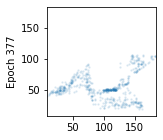

Epoch 378 elbo -8.791585


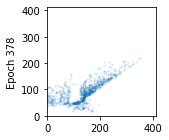

Reconstruction:


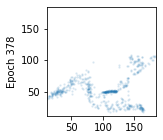

Epoch 379 elbo -8.823145


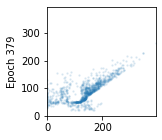

Reconstruction:


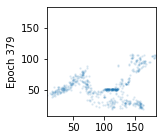

Epoch 380 elbo -8.956696


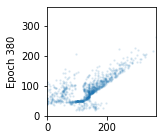

Reconstruction:


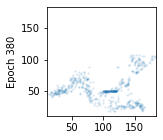

Epoch 381 elbo -9.075131


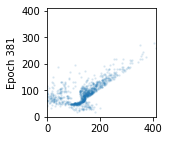

Reconstruction:


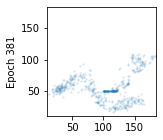

Epoch 382 elbo -9.263645


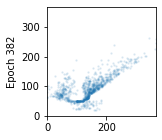

Reconstruction:


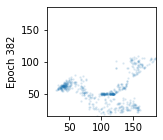

Epoch 383 elbo -8.812053


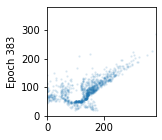

Reconstruction:


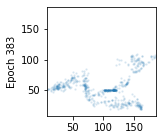

Epoch 384 elbo -8.73435


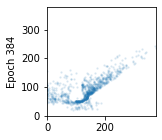

Reconstruction:


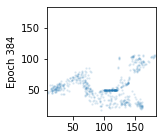

Epoch 385 elbo -8.900941


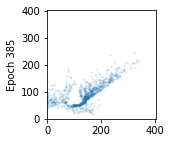

Reconstruction:


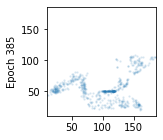

Epoch 386 elbo -9.253752


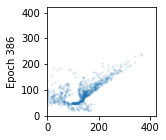

Reconstruction:


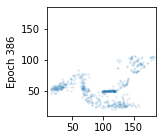

Epoch 387 elbo -8.726772


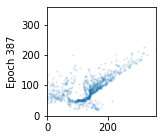

Reconstruction:


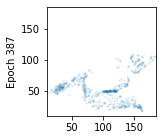

Epoch 388 elbo -8.696872


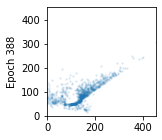

Reconstruction:


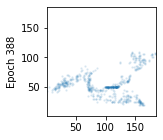

Epoch 389 elbo -8.727985


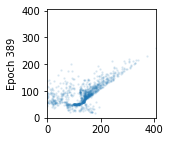

Reconstruction:


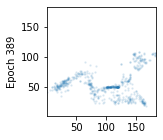

Epoch 390 elbo -9.01596


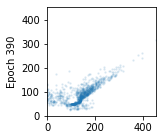

Reconstruction:


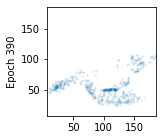

Epoch 391 elbo -9.000558


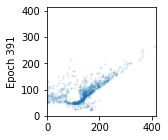

Reconstruction:


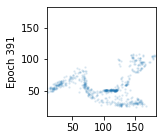

Epoch 392 elbo -8.825694


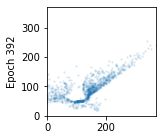

Reconstruction:


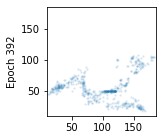

Epoch 393 elbo -8.755661


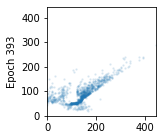

Reconstruction:


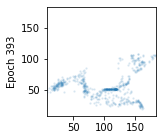

Epoch 394 elbo -8.754296


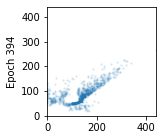

Reconstruction:


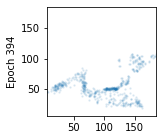

Epoch 395 elbo -8.726987


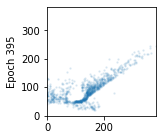

Reconstruction:


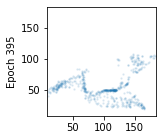

Epoch 396 elbo -8.768664


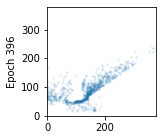

Reconstruction:


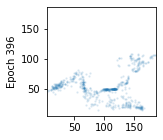

Epoch 397 elbo -8.89217


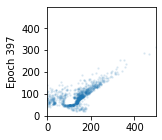

Reconstruction:


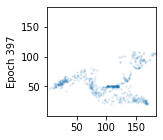

Epoch 398 elbo -8.878342


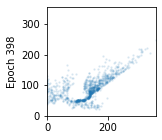

Reconstruction:


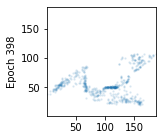

Epoch 399 elbo -8.81379


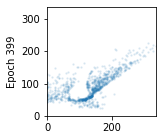

Reconstruction:


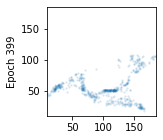

Epoch 400 elbo -8.790883


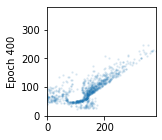

Reconstruction:


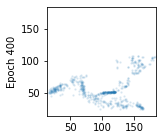

Epoch 401 elbo -8.984793


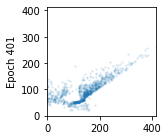

Reconstruction:


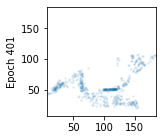

Epoch 402 elbo -8.966214


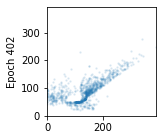

Reconstruction:


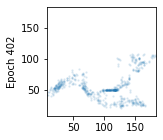

Epoch 403 elbo -8.823106


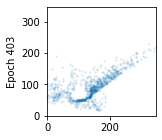

Reconstruction:


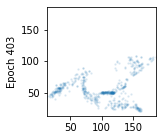

Epoch 404 elbo -8.658617


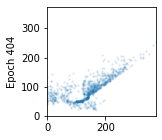

Reconstruction:


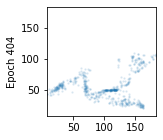

Epoch 405 elbo -8.7916975


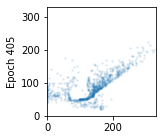

Reconstruction:


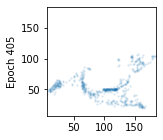

Epoch 406 elbo -8.91826


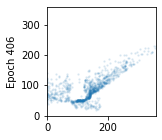

Reconstruction:


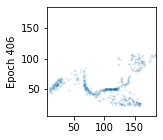

Epoch 407 elbo -8.798452


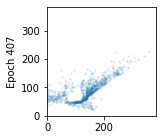

Reconstruction:


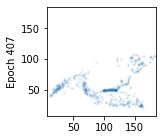

Epoch 408 elbo -8.819554


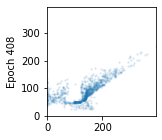

Reconstruction:


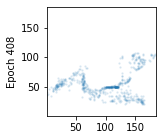

Epoch 409 elbo -8.836373


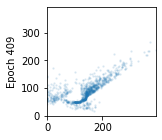

Reconstruction:


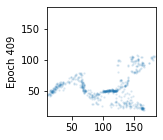

Epoch 410 elbo -8.958773


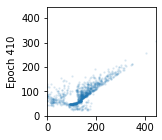

Reconstruction:


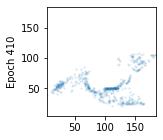

Epoch 411 elbo -8.660324


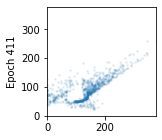

Reconstruction:


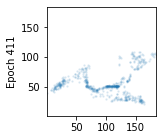

Epoch 412 elbo -8.692443


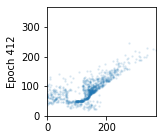

Reconstruction:


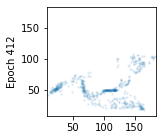

Epoch 413 elbo -9.302848


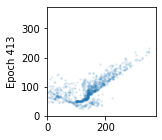

Reconstruction:


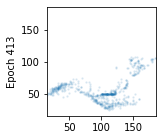

Epoch 414 elbo -8.714491


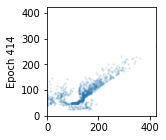

Reconstruction:


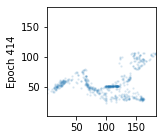

Epoch 415 elbo -8.880426


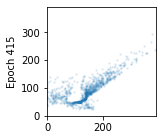

Reconstruction:


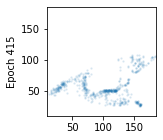

Epoch 416 elbo -8.778355


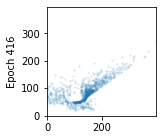

Reconstruction:


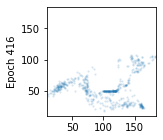

Epoch 417 elbo -8.885381


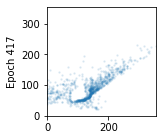

Reconstruction:


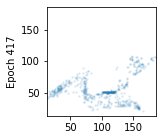

Epoch 418 elbo -9.851266


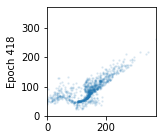

Reconstruction:


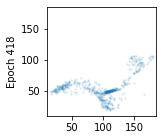

Epoch 419 elbo -9.439054


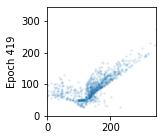

Reconstruction:


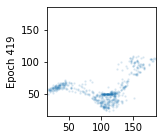

Epoch 420 elbo -9.317606


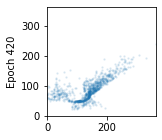

Reconstruction:


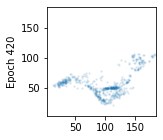

Epoch 421 elbo -9.231431


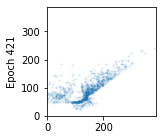

Reconstruction:


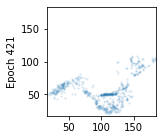

Epoch 422 elbo -8.975674


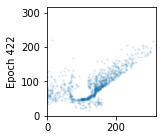

Reconstruction:


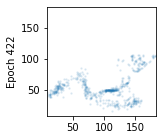

Epoch 423 elbo -9.440416


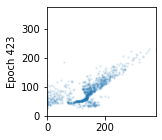

Reconstruction:


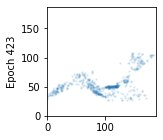

Epoch 424 elbo -8.947869


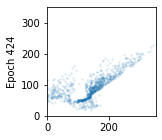

Reconstruction:


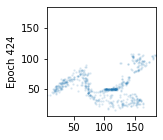

Epoch 425 elbo -9.067242


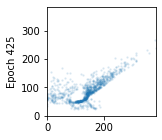

Reconstruction:


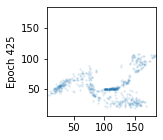

Epoch 426 elbo -8.887316


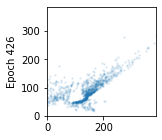

Reconstruction:


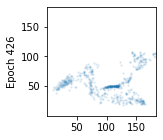

Epoch 427 elbo -8.829579


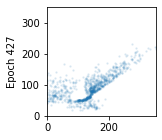

Reconstruction:


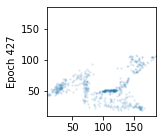

Epoch 428 elbo -9.074557


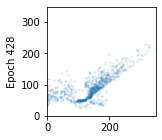

Reconstruction:


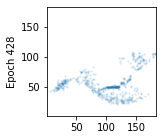

Epoch 429 elbo -8.773164


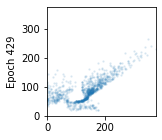

Reconstruction:


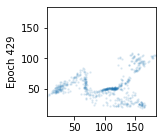

Epoch 430 elbo -8.895832


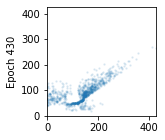

Reconstruction:


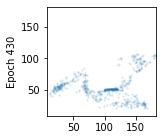

Epoch 431 elbo -8.838047


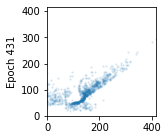

Reconstruction:


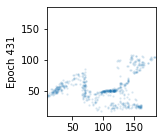

Epoch 432 elbo -8.717642


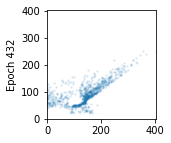

Reconstruction:


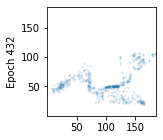

Epoch 433 elbo -8.717016


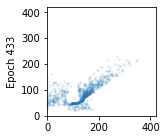

Reconstruction:


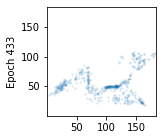

Epoch 434 elbo -8.86557


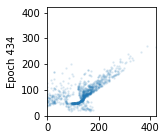

Reconstruction:


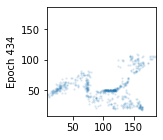

Epoch 435 elbo -8.756659


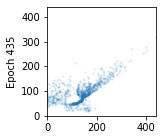

Reconstruction:


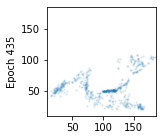

Epoch 436 elbo -8.7807455


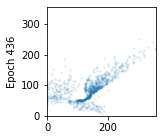

Reconstruction:


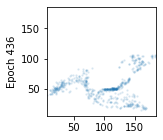

Epoch 437 elbo -8.860928


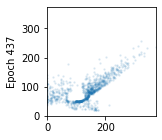

Reconstruction:


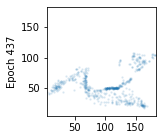

Epoch 438 elbo -8.617141


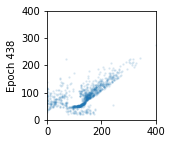

Reconstruction:


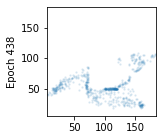

Epoch 439 elbo -8.633703


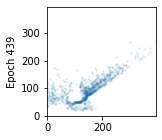

Reconstruction:


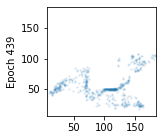

Epoch 440 elbo -8.687862


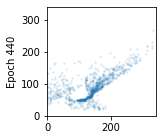

Reconstruction:


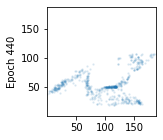

Epoch 441 elbo -8.706592


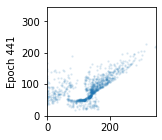

Reconstruction:


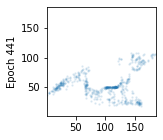

Epoch 442 elbo -8.716625


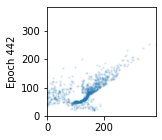

Reconstruction:


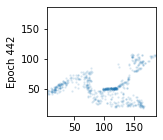

Epoch 443 elbo -8.897007


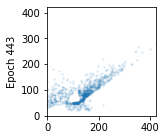

Reconstruction:


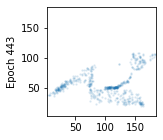

Epoch 444 elbo -9.343763


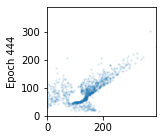

Reconstruction:


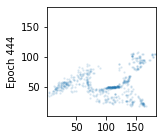

Epoch 445 elbo -8.971231


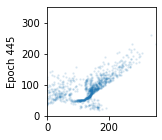

Reconstruction:


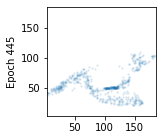

Epoch 446 elbo -8.839489


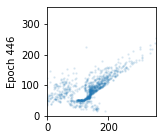

Reconstruction:


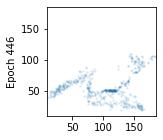

Epoch 447 elbo -8.829954


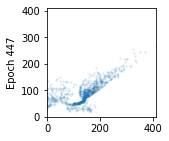

Reconstruction:


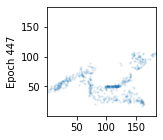

Epoch 448 elbo -8.678868


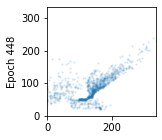

Reconstruction:


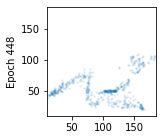

Epoch 449 elbo -8.786004


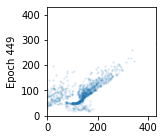

Reconstruction:


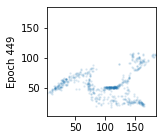

Epoch 450 elbo -8.705963


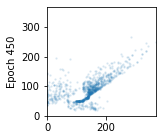

Reconstruction:


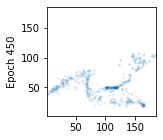

Epoch 451 elbo -8.756705


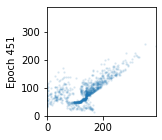

Reconstruction:


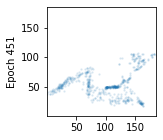

Epoch 452 elbo -8.6917305


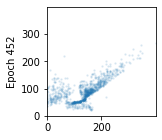

Reconstruction:


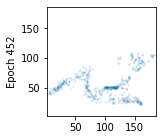

Epoch 453 elbo -8.683405


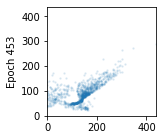

Reconstruction:


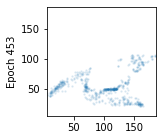

Epoch 454 elbo -8.930746


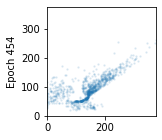

Reconstruction:


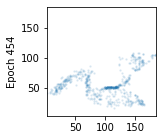

Epoch 455 elbo -8.859196


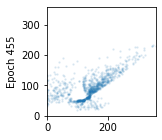

Reconstruction:


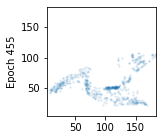

Epoch 456 elbo -8.832607


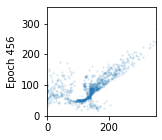

Reconstruction:


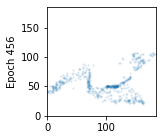

Epoch 457 elbo -8.79709


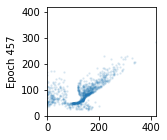

Reconstruction:


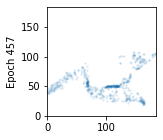

Epoch 458 elbo -8.759279


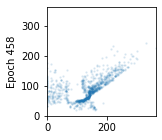

Reconstruction:


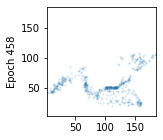

Epoch 459 elbo -8.890452


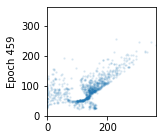

Reconstruction:


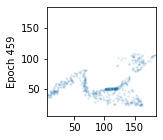

Epoch 460 elbo -8.775462


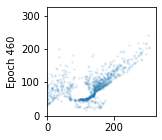

Reconstruction:


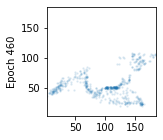

Epoch 461 elbo -9.023747


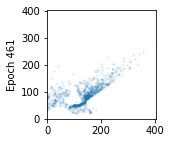

Reconstruction:


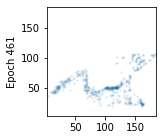

Epoch 462 elbo -8.770443


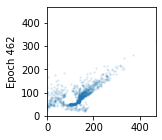

Reconstruction:


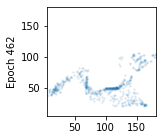

Epoch 463 elbo -8.765816


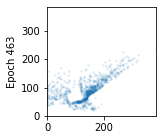

Reconstruction:


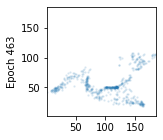

Epoch 464 elbo -8.780555


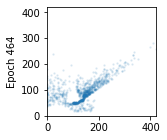

Reconstruction:


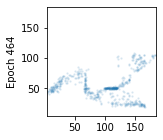

Epoch 465 elbo -8.721588


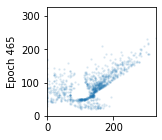

Reconstruction:


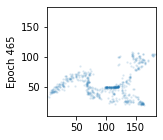

Epoch 466 elbo -8.8934355


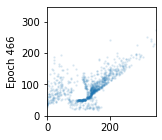

Reconstruction:


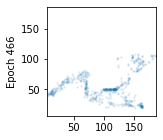

Epoch 467 elbo -9.056602


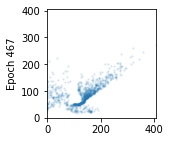

Reconstruction:


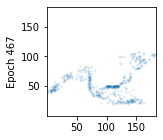

Epoch 468 elbo -8.669245


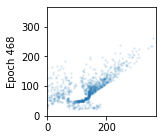

Reconstruction:


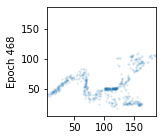

Epoch 469 elbo -8.794694


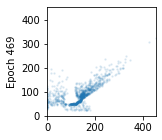

Reconstruction:


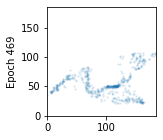

Epoch 470 elbo -9.069231


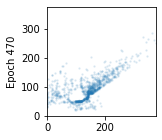

Reconstruction:


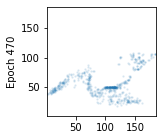

Epoch 471 elbo -8.59913


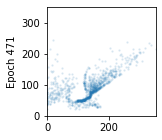

Reconstruction:


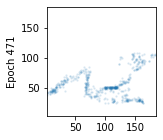

Epoch 472 elbo -8.606277


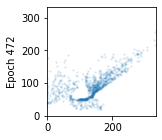

Reconstruction:


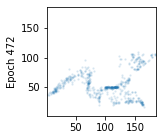

Epoch 473 elbo -8.664227


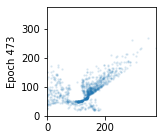

Reconstruction:


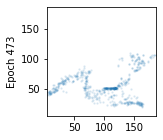

Epoch 474 elbo -8.761883


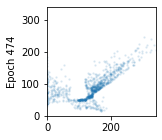

Reconstruction:


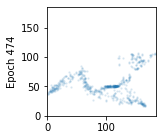

Epoch 475 elbo -8.683356


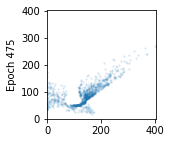

Reconstruction:


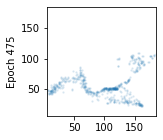

Epoch 476 elbo -8.647445


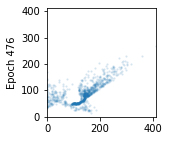

Reconstruction:


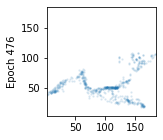

Epoch 477 elbo -9.680019


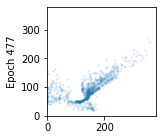

Reconstruction:


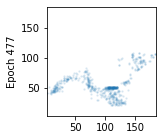

Epoch 478 elbo -8.727358


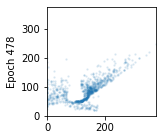

Reconstruction:


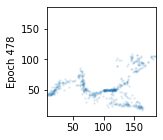

Epoch 479 elbo -8.722367


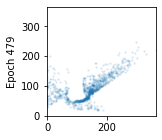

Reconstruction:


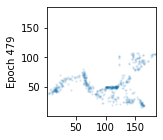

Epoch 480 elbo -8.729719


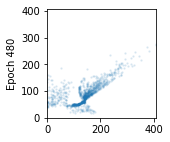

Reconstruction:


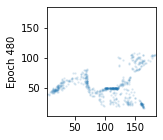

Epoch 481 elbo -8.743319


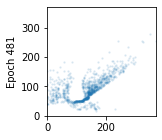

Reconstruction:


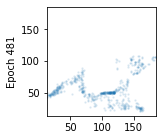

Epoch 482 elbo -8.892237


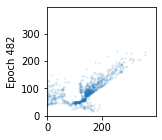

Reconstruction:


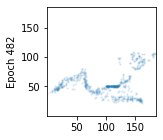

Epoch 483 elbo -8.815207


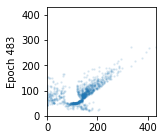

Reconstruction:


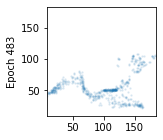

Epoch 484 elbo -8.819783


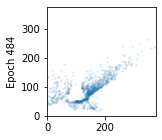

Reconstruction:


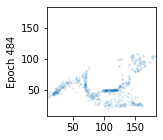

Epoch 485 elbo -8.744417


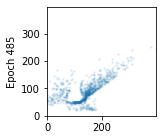

Reconstruction:


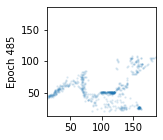

Epoch 486 elbo -9.493549


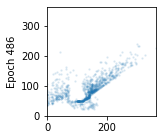

Reconstruction:


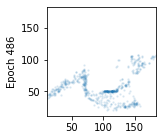

Epoch 487 elbo -8.899384


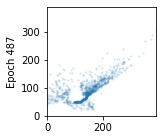

Reconstruction:


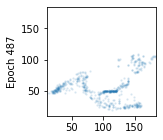

Epoch 488 elbo -8.781787


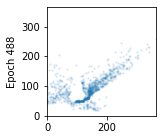

Reconstruction:


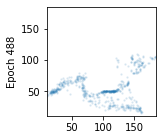

Epoch 489 elbo -8.815176


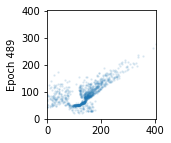

Reconstruction:


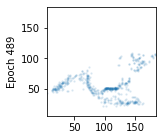

Epoch 490 elbo -8.736413


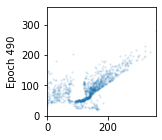

Reconstruction:


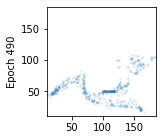

Epoch 491 elbo -8.686019


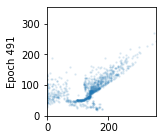

Reconstruction:


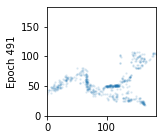

Epoch 492 elbo -8.965979


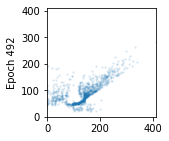

Reconstruction:


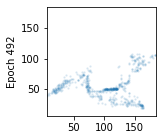

Epoch 493 elbo -8.761082


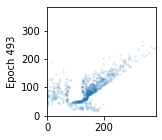

Reconstruction:


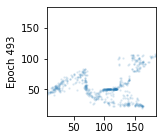

Epoch 494 elbo -8.688161


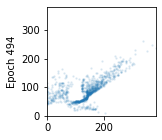

Reconstruction:


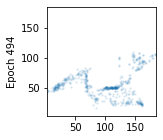

Epoch 495 elbo -8.566717


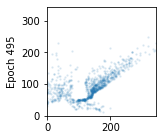

Reconstruction:


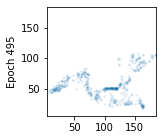

Epoch 496 elbo -8.996297


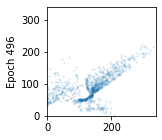

Reconstruction:


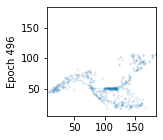

Epoch 497 elbo -9.095562


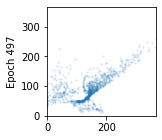

Reconstruction:


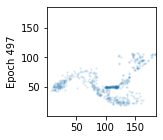

Epoch 498 elbo -8.669419


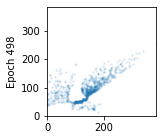

Reconstruction:


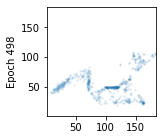

Epoch 499 elbo -8.712998


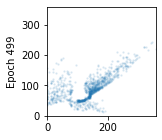

Reconstruction:


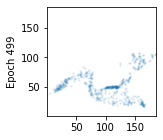

Epoch 500 elbo -9.557405


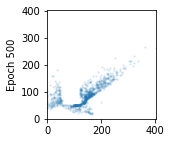

Reconstruction:


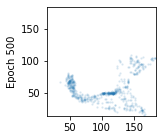

Epoch 501 elbo -8.766892


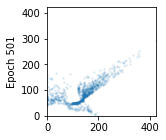

Reconstruction:


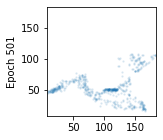

Epoch 502 elbo -8.678285


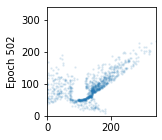

Reconstruction:


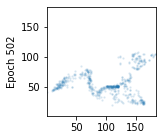

Epoch 503 elbo -8.728005


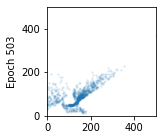

Reconstruction:


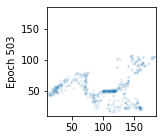

Epoch 504 elbo -10.070762


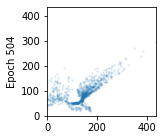

Reconstruction:


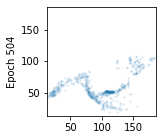

Epoch 505 elbo -8.826977


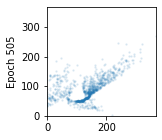

Reconstruction:


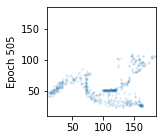

Epoch 506 elbo -8.772591


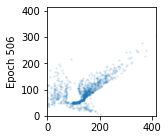

Reconstruction:


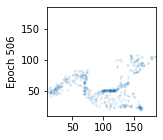

Epoch 507 elbo -8.785322


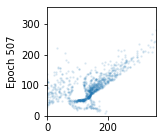

Reconstruction:


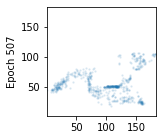

Epoch 508 elbo -8.909299


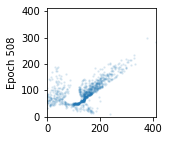

Reconstruction:


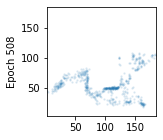

Epoch 509 elbo -8.7047615


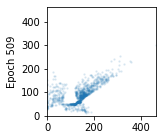

Reconstruction:


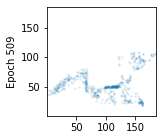

Epoch 510 elbo -8.929818


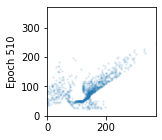

Reconstruction:


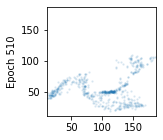

Epoch 511 elbo -8.779229


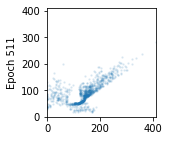

Reconstruction:


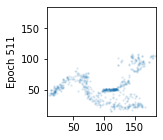

Epoch 512 elbo -8.961286


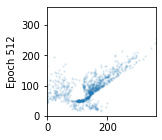

Reconstruction:


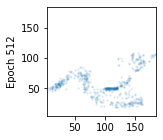

Epoch 513 elbo -9.4116335


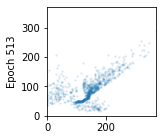

Reconstruction:


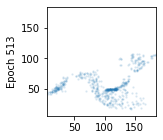

Epoch 514 elbo -8.639407


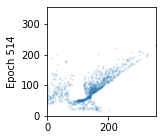

Reconstruction:


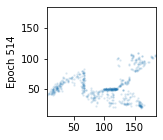

Epoch 515 elbo -8.8281765


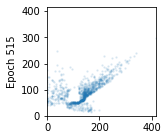

Reconstruction:


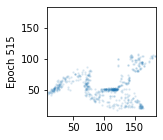

Epoch 516 elbo -8.902255


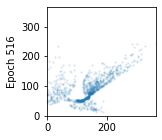

Reconstruction:


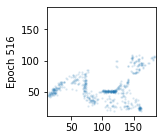

Epoch 517 elbo -8.67294


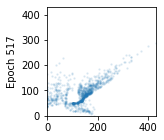

Reconstruction:


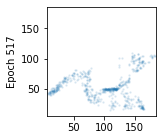

Epoch 518 elbo -8.851105


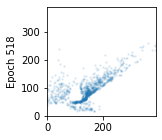

Reconstruction:


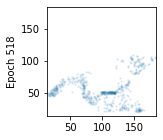

Epoch 519 elbo -8.84707


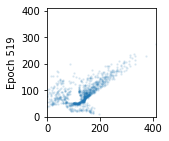

Reconstruction:


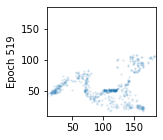

Epoch 520 elbo -8.760596


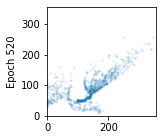

Reconstruction:


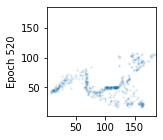

Epoch 521 elbo -8.730632


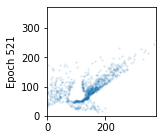

Reconstruction:


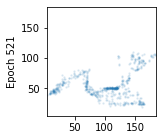

Epoch 522 elbo -8.760339


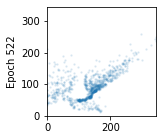

Reconstruction:


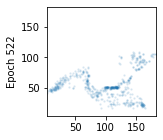

Epoch 523 elbo -10.715307


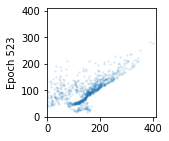

Reconstruction:


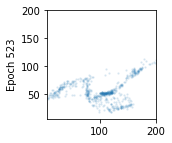

Epoch 524 elbo -9.153914


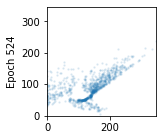

Reconstruction:


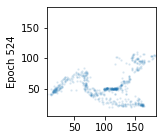

Epoch 525 elbo -9.493042


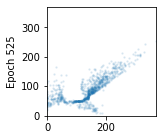

Reconstruction:


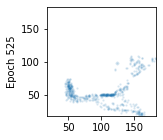

Epoch 526 elbo -9.282347


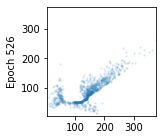

Reconstruction:


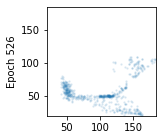

Epoch 527 elbo -9.203468


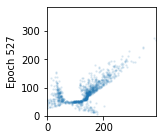

Reconstruction:


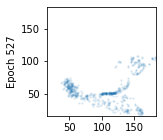

Epoch 528 elbo -8.830258


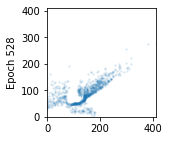

Reconstruction:


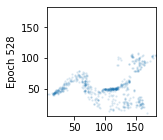

Epoch 529 elbo -8.711069


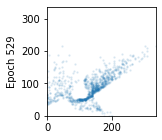

Reconstruction:


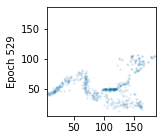

Epoch 530 elbo -8.778203


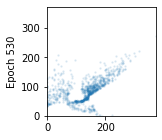

Reconstruction:


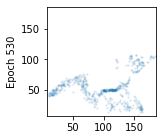

Epoch 531 elbo -8.601268


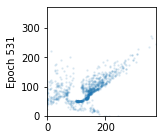

Reconstruction:


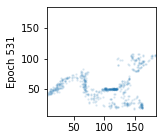

Epoch 532 elbo -8.838901


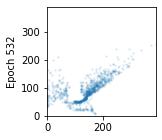

Reconstruction:


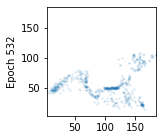

Epoch 533 elbo -8.620875


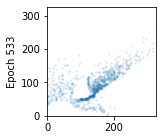

Reconstruction:


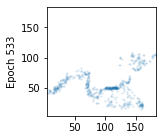

Epoch 534 elbo -8.930098


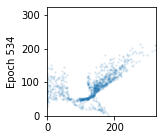

Reconstruction:


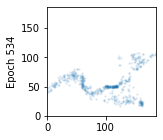

Epoch 535 elbo -8.708771


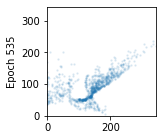

Reconstruction:


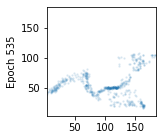

Epoch 536 elbo -8.736787


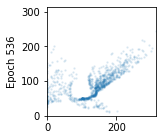

Reconstruction:


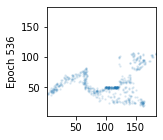

Epoch 537 elbo -9.53296


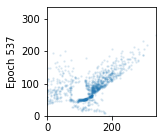

Reconstruction:


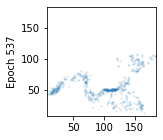

Epoch 538 elbo -8.733645


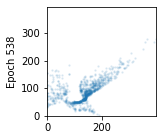

Reconstruction:


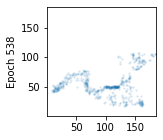

Epoch 539 elbo -8.672186


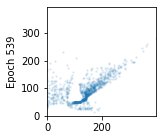

Reconstruction:


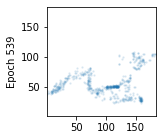

Epoch 540 elbo -8.694258


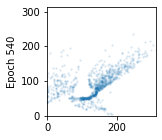

Reconstruction:


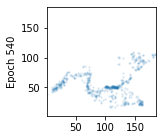

Epoch 541 elbo -9.663167


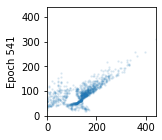

Reconstruction:


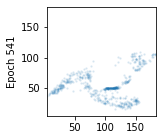

Epoch 542 elbo -9.066464


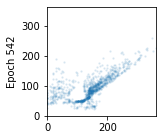

Reconstruction:


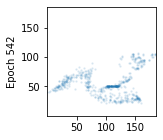

Epoch 543 elbo -8.852952


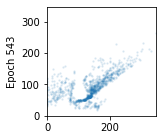

Reconstruction:


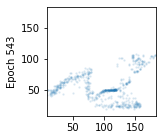

Epoch 544 elbo -10.05334


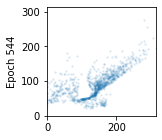

Reconstruction:


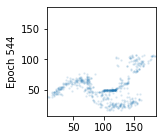

Epoch 545 elbo -8.906432


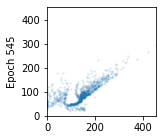

Reconstruction:


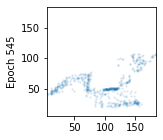

Epoch 546 elbo -8.733995


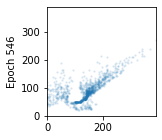

Reconstruction:


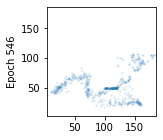

Epoch 547 elbo -8.663312


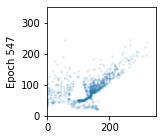

Reconstruction:


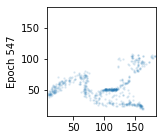

Epoch 548 elbo -9.107313


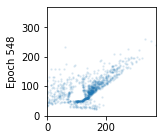

Reconstruction:


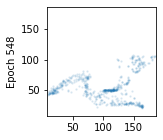

Epoch 549 elbo -8.729277


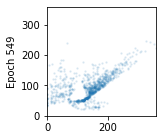

Reconstruction:


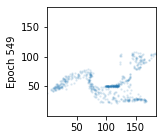

Epoch 550 elbo -9.061325


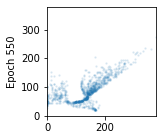

Reconstruction:


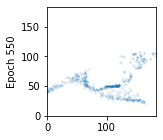

Epoch 551 elbo -8.731867


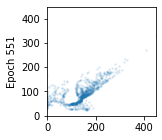

Reconstruction:


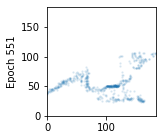

Epoch 552 elbo -8.9045925


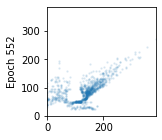

Reconstruction:


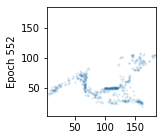

Epoch 553 elbo -8.809536


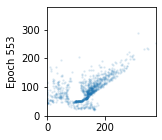

Reconstruction:


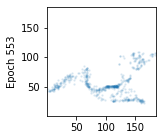

Epoch 554 elbo -8.826211


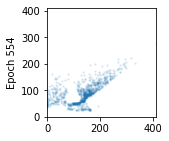

Reconstruction:


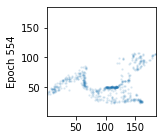

Epoch 555 elbo -10.75796


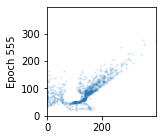

Reconstruction:


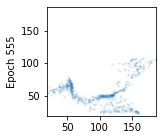

Epoch 556 elbo -8.805671


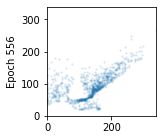

Reconstruction:


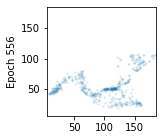

Epoch 557 elbo -9.362659


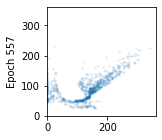

Reconstruction:


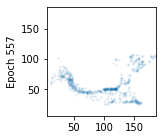

Epoch 558 elbo -8.835714


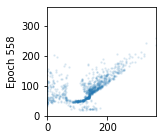

Reconstruction:


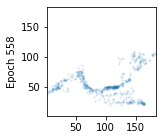

Epoch 559 elbo -8.7093


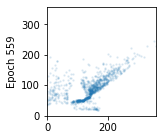

Reconstruction:


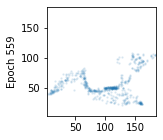

Epoch 560 elbo -8.645249


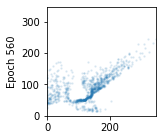

Reconstruction:


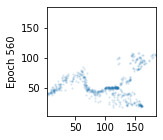

Epoch 561 elbo -8.772924


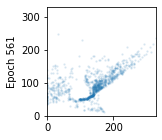

Reconstruction:


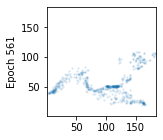

Epoch 562 elbo -8.547749


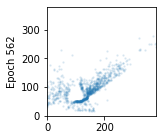

Reconstruction:


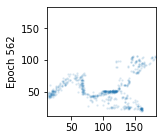

Epoch 563 elbo -8.588314


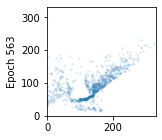

Reconstruction:


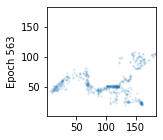

Epoch 564 elbo -8.784176


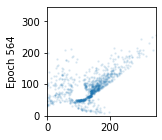

Reconstruction:


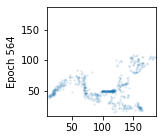

Epoch 565 elbo -9.5038805


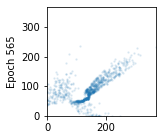

Reconstruction:


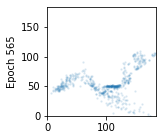

Epoch 566 elbo -9.477531


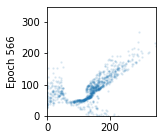

Reconstruction:


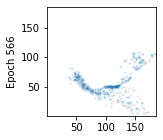

Epoch 567 elbo -9.214945


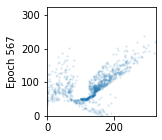

Reconstruction:


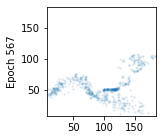

Epoch 568 elbo -8.94537


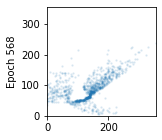

Reconstruction:


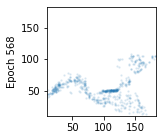

Epoch 569 elbo -8.95033


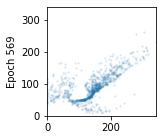

Reconstruction:


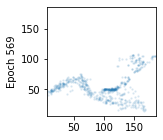

Epoch 570 elbo -9.0100975


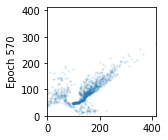

Reconstruction:


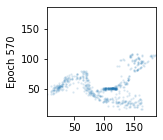

Epoch 571 elbo -8.830491


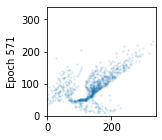

Reconstruction:


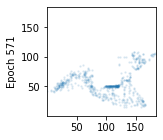

Epoch 572 elbo -8.819121


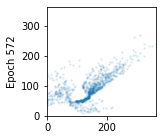

Reconstruction:


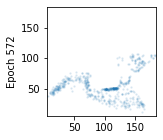

Epoch 573 elbo -8.654105


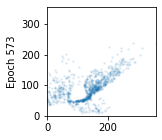

Reconstruction:


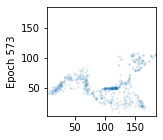

Epoch 574 elbo -8.7438545


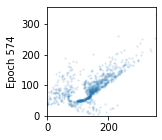

Reconstruction:


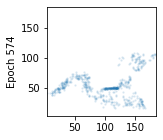

Epoch 575 elbo -9.071379


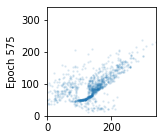

Reconstruction:


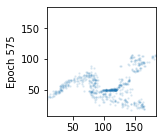

Epoch 576 elbo -8.772852


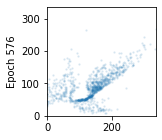

Reconstruction:


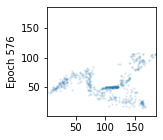

Epoch 577 elbo -8.794425


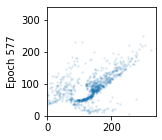

Reconstruction:


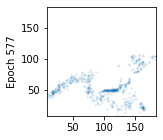

Epoch 578 elbo -8.652396


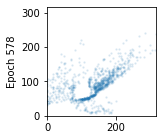

Reconstruction:


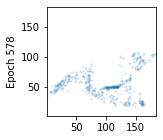

Epoch 579 elbo -9.859227


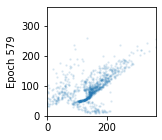

Reconstruction:


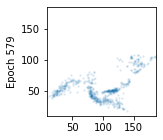

Epoch 580 elbo -8.61698


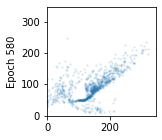

Reconstruction:


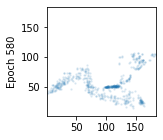

Epoch 581 elbo -8.790354


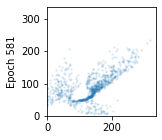

Reconstruction:


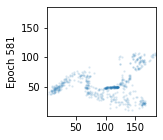

Epoch 582 elbo -8.638317


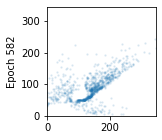

Reconstruction:


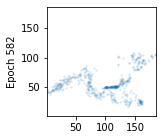

Epoch 583 elbo -8.593932


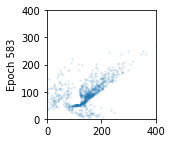

Reconstruction:


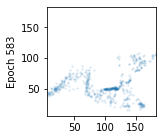

Epoch 584 elbo -9.4999075


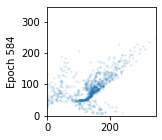

Reconstruction:


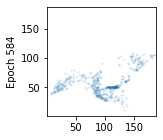

Epoch 585 elbo -9.134907


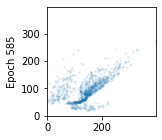

Reconstruction:


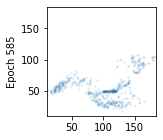

Epoch 586 elbo nan


ValueError: Axis limits cannot be NaN or Inf

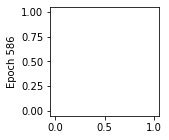

In [6]:
samples, _ = make_decoder(prior.sample(1000), [2])
s1_5k, _ = make_decoder(prior.sample(1500), [2])
s2k, _ = make_decoder(prior.sample(2000), [2])
s3k, _ = make_decoder(prior.sample(3000), [2])
s5k, _ = make_decoder(prior.sample(5000), [2])
s10k, _ = make_decoder(prior.sample(10000), [2])

t1_5k = None
t2k = None
t3k = None
t5k = None
t10k = None

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for epoch in range(5000):
        test_elbo, test_codes, test_samples, test_loc, t1_5k, t2k, t3k, t5k, t10k = sess.run([elbo, code, samples, loc, s1_5k, s2k, s3k, s5k, s10k], {data: X_test})
        print('Epoch', epoch, 'elbo', test_elbo)
        plot(epoch, test_samples, size=2)
        print('Reconstruction:')
        plot(epoch, test_loc, size=2)
        for _ in range(600):
            indices = np.random.choice(X_train.shape[0], 128)
            batch = X_train[indices]
            sess.run(optimize, {data: batch})